# ESOL Datasets:

## Libraries required

We will use the standard data science and machine learning libraries: 

In [1]:
# Pandas and numpy for data manipulation
import pandas as pd
import numpy as np
# Matplotlib visualization
import matplotlib.pyplot as plt
# Seaborn for visualization
import seaborn as sns
#Regression
import statsmodels.api as sm 
# Splitting data into training and testing
from sklearn.model_selection import train_test_split
#Desicion tree regression
from sklearn.tree import DecisionTreeRegressor
#R^2 score
from sklearn import metrics
# MLP 
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor
# Support vector machine
from sklearn.svm import SVR

In [2]:
import warnings
warnings.simplefilter('ignore')

## Data Cleaning and Formatting
### Load in the Data and Examine

We will be loading our data into a pandas dataframe, one of the most useful data structures for data science. Think of it as a spreadsheet within Python that we can easily manipulate, clean, and visualize.

In [3]:
# Read in data into a dataframe 
df_features= pd.read_csv("delaney(esol)_global_cdf_rdkit.csv" )
df_target = pd.read_csv("delaney.csv")

In [4]:
#show all of rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
df_features.columns = ["x" + str(i) for i in range( 1, 202)]

In [6]:
df_features.shape

(1128, 201)

In [7]:
df_target.shape

(1128, 2)

In [8]:
df_features.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x153,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x165,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
0,True,0.431154,0.304703,0.742380,0.611255,0.564015,0.695016,0.628013,0.550359,0.632004,0.526516,0.647978,0.533322,0.567960,0.441039,9.662156e-01,9.852195e-01,6.893569e-07,0.100218,0.131846,2.509948e-11,9.258417e-11,8.288383e-01,0.464812,2.391450e-11,8.205149e-01,0.722986,0.070685,0.057481,0.064305,9.048759e-01,0.837960,0.706530,0.720712,0.999999,0.815583,0.810059,0.640453,0.664681,0.063911,0.247244,0.063911,0.147762,0.953012,0.131673,0.103607,0.739923,0.003525,0.448071,0.725344,0.976294,0.966670,9.938587e-22,0.957848,0.937037,0.358207,4.829930e-15,0.083758,0.995719,0.980289,0.909622,5.695163e-08,0.589126,0.0,9.965274e-01,9.427922e-01,0.813345,0.992788,9.975295e-01,9.982472e-01,0.14598,1.735567e-22,1.180938e-10,0.059983,9.054986e-08,9.599556e-01,0.157072,0.557489,0.038706,0.080760,0.717309,0.396614,0.958498,0.073182,1.000000,0.075581,8.786222e-24,0.903969,0.452312,0.211062,0.000053,7.022209e-01,0.037316,6.952720e-13,0.0,9.796909e-13,0.975749,7.576478e-01,9.666701e-01,0.189595,0.256137,0.000003,0.277639,0.000053,0.979390,0.000053,0.500000,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.399821,0.959374,5.708678e-19,1.000000e+00,1.000000e+00,7.105427e-15,5.837076e-13,1.198806e-20,0.16508,0.167041,0.166498,0.166487,0.202865,0.069366,7.105427e-15,0.168346,0.167983,2.774304e-01,0.001182,0.164333,0.000838,0.166326,0.163034,0.16508,9.569705e-08,3.497089e-08,0.168206,0.165807,0.167347,7.139646e-07,2.641151e-12,0.099913,2.868092e-10,0.377738,0.004506,0.13325,0.358229,1.614829e-09,1.875173e-18,2.094105e-07,7.105427e-15,0.499264,0.164929,9.066538e-01,2.111644e-16,1.168159e-09,3.259236e-22,6.246014e-10,0.168149,0.165451,1.171103e-13,0.0,0.164669,0.166925,0.0,5.100713e-08,7.105427e-15,0.154654,2.794209e-22,0.975564,0.16764,6.314993e-25,0.168186,0.009089,0.168363,8.265423e-11,0.156346,0.0,0.0,0.021135,0.021135,2.388156e-20,0.0,8.336725e-25,0.000053,0.156951,4.034345e-08,1.552592e-23,1.593061e-17,5.766101e-14,2.957989e-11,0.168378,0.16738,1.481515e-18,2.324150e-16,4.703598e-08,0.166633,0.069877
1,True,0.831056,0.076056,0.026948,0.030340,0.020389,0.033934,0.032592,0.020369,0.029170,0.015533,0.038519,0.021520,0.041210,0.024028,4.074888e-10,2.648697e-01,6.893569e-07,0.218593,0.307374,1.510129e-01,6.498039e-01,5.663300e-01,0.651997,1.691932e-01,3.299699e-01,0.018750,0.715690,0.681483,0.524134,1.024882e-01,0.761894,0.030800,0.019873,0.999999,0.018461,0.031261,0.270675,0.024863,0.170656,0.621108,0.170656,0.471558,0.645191,0.461801,0.671181,0.369043,0.356780,0.031043,0.018333,0.436077,0.124047,9.938587e-22,0.142492,0.062963,0.358207,8.650382e-01,0.385834,0.084739,0.474469,0.033458,5.695163e-08,0.052057,0.0,1.142427e-21,2.402455e-23,0.063582,0.341428,4.669819e-01,3.608753e-15,0.14598,9.778082e-01,1.180938e-10,0.312257,9.054986e-08,4.609784e-10,0.157072,0.366640,0.198489,0.142831,0.465176,0.120266,0.298693,0.235566,0.167097,0.075581,8.786222e-24,0.123383,0.183907,0.470509,0.000053,1.426576e-16,0.314426,9.838373e-01,0.0,9.796909e-13,0.010608,1.204931e-11,9.472168e-01,0.288112,0.529600,0.000003,0.277639,0.000053,0.108453,0.000053,0.500000,0.38471,0.000053,0.000053,0

In [9]:
df_features.tail()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x153,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x165,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
1123,True,0.990198,0.001454,0.001005,0.000057,0.001471,0.000289,0.000067,0.001745,0.000172,0.007232,0.000039,0.001506,0.000017,0.000013,7.523683e-01,6.547047e-01,6.893569e-07,0.100218,0.019674,2.509948e-11,9.258417e-11,5.856109e-17,0.000001,0.725617,7.522456e-13,0.016097,0.952612,0.154211,0.014846,0.999390,0.995070,0.000481,0.023885,0.999999,0.004468,0.001579,0.410474,0.001191,0.097344,0.310887,0.097344,0.956922,0.999792,0.092404,0.035422,0.955508,0.283222,0.000308,0.016396,0.061316,0.033330,9.938587e-22,0.142492,0.062963,0.034723,4.829930e-15,0.011178,0.018976,0.055287,0.207512,5.695163e-08,0.002152,0.0,1.142427e-21,2.402455e-23,0.027765,0.008722,5.761429e-21,9.753765e-01,0.145980,1.735567e-22,9.026408e-01,0.059983,9.054986e-08,9.905036e-01,0.999996,0.327005,0.023724,0.080760,0.027501,0.004928,0.498373,0.701900,0.167097,0.075581,8.786222e-24,0.199695,0.030449,0.025837,0.000053,1.426576e-16,0.037316,9.960060e-01,0.0,9.953328e-01,0.042349,1.204931e-11,2.863050e-09,0.008254,0.030994,0.000003,0.277639,0.000053,0.006171,0.000053,0.989265,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.985273,0.016845,5.708678e-19,3.323628e-10,9.641976e-10,7.105427e-15,5.837076e-13,1.198806e-20,0.16508,0.167041,0.166498,0.166487,0.202865,0.069366,7.105427e-15,0.168346,0.167983,6.871899e-10,0.001182,0.164333,0.000838,0.166326,0.163034,0.16508,9.569705e-08,3.497089e-08,0.168206,1.000000,0.167347,7.139646e-07,2.641151e-12,0.099913,2.868092e-10,0.377738,0.004506,0.13325,0.034730,1.614829e-09,1.875173e-18,2.094105e-07,7.105427e-15,0.499264,0.164929,1.317445e-17,2.111644e-16,1.168159e-09,9.965916e-01,6.246014e-10,0.168149,0.165451,1.171103e-13,0.0,0.164669,0.166925,0.0,5.100713e-08,7.105427e-15,0.154654,2.794209e-22,0.0,0.16764,6.314993e-25,0.168186,0.009089,0.168363,8.265423e-11,0.156346,0.0,0.0,0.021135,0.021135,2.388156e-20,0.0,8.336725e-25,0.000053,0.156951,4.034345e-08,1.552592e-23,1.593061e-17,5.766101e-14,2.957989e-11,0.168378,0.16738,1.481515e-18,2.324150e-16,4.703598e-08,0.166633,0.389821
1124,True,0.997000,0.014982,0.034384,0.033802,0.038438,0.019231,0.011211,0.027564,0.008905,0.015833,0.004994,0.012184,0.002233,0.008358,6.095890e-01,5.113023e-01,6.893569e-07,0.386881,0.019674,3.062582e-01,7.700123e-01,7.027835e-01,0.000001,0.471417,7.522456e-13,0.030821,0.952612,0.787999,0.288624,0.827873,0.918878,0.021221,0.031473,0.999999,0.095940,0.224182,0.522810,0.023173,0.123522,0.387766,0.123522,0.967552,0.587905,0.879142,0.309071,0.840236,0.038631,0.024133,0.030065,0.436077,0.500000,9.938587e-22,0.142492,0.062963,0.034723,4.829930e-15,0.011178,0.492265,0.474469,0.490771,5.695163e-08,0.016146,0.0,1.142427e-21,2.402455e-23,0.071394,0.366322,5.761429e-21,3.608753e-15,0.819266,9.778082e-01,9.009268e-01,0.620364,6.341740e-01,4.609784e-10,0.999996,0.120349,0.041115,0.497093,0.027501,0.004928,0.570635,0.734401,0.167097,0.428469,9.842428e-01,0.019854,0.763707,0.025837,0.000053,1.426576e-16,0.314426,9.789076e-01,0.0,9.857462e-01,0.706744,4.646681e-01,2.863050e-09,0.008254,0.046135,0.000003,0.277639,0.000053,0.470915,0.000053,0.922483,0.38471,0.000053,0.000053,0.164665,0.000

In [10]:
df_features.var()==0

x1       True
x2      False
x3      False
x4      False
x5      False
x6      False
x7      False
x8      False
x9      False
x10     False
x11     False
x12     False
x13     False
x14     False
x15     False
x16     False
x17     False
x18     False
x19     False
x20     False
x21     False
x22     False
x23     False
x24     False
x25     False
x26     False
x27     False
x28     False
x29     False
x30     False
x31     False
x32     False
x33     False
x34     False
x35     False
x36     False
x37     False
x38     False
x39     False
x40     False
x41     False
x42     False
x43     False
x44     False
x45     False
x46     False
x47     False
x48     False
x49     False
x50     False
x51     False
x52     False
x53     False
x54     False
x55     False
x56     False
x57     False
x58     False
x59     False
x60     False
x61     False
x62     False
x63     False
x64     False
x65     False
x66     False
x67     False
x68     False
x69     False
x70     False
x71     False
x72   

In [11]:
df_features.drop(['x1', 'x62' , 'x153','x165'] , axis= 1 , inplace= True)

In [12]:
df_features.head()

,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
0,0.431154,0.304703,0.742380,0.611255,0.564015,0.695016,0.628013,0.550359,0.632004,0.526516,0.647978,0.533322,0.567960,0.441039,9.662156e-01,9.852195e-01,6.893569e-07,0.100218,0.131846,2.509948e-11,9.258417e-11,8.288383e-01,0.464812,2.391450e-11,8.205149e-01,0.722986,0.070685,0.057481,0.064305,9.048759e-01,0.837960,0.706530,0.720712,0.999999,0.815583,0.810059,0.640453,0.664681,0.063911,0.247244,0.063911,0.147762,0.953012,0.131673,0.103607,0.739923,0.003525,0.448071,0.725344,0.976294,0.966670,9.938587e-22,0.957848,0.937037,0.358207,4.829930e-15,0.083758,0.995719,0.980289,0.909622,0.589126,0.0,9.965274e-01,9.427922e-01,0.813345,0.992788,9.975295e-01,9.982472e-01,0.14598,1.735567e-22,1.180938e-10,0.059983,9.054986e-08,9.599556e-01,0.157072,0.557489,0.038706,0.080760,0.717309,0.396614,0.958498,0.073182,1.000000,0.075581,8.786222e-24,0.903969,0.452312,0.211062,0.000053,7.022209e-01,0.037316,6.952720e-13,0.0,9.796909e-13,0.975749,7.576478e-01,9.666701e-01,0.189595,0.256137,0.000003,0.277639,0.000053,0.979390,0.000053,0.500000,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.399821,0.959374,5.708678e-19,1.000000e+00,1.000000e+00,7.105427e-15,5.837076e-13,1.198806e-20,0.16508,0.167041,0.166498,0.166487,0.202865,0.069366,7.105427e-15,0.168346,0.167983,2.774304e-01,0.001182,0.164333,0.000838,0.166326,0.163034,0.16508,9.569705e-08,3.497089e-08,0.168206,0.165807,0.167347,7.139646e-07,2.641151e-12,0.099913,2.868092e-10,0.377738,0.004506,0.13325,0.358229,1.614829e-09,1.875173e-18,7.105427e-15,0.499264,0.164929,9.066538e-01,2.111644e-16,1.168159e-09,3.259236e-22,6.246014e-10,0.168149,0.165451,1.171103e-13,0.164669,0.166925,0.0,5.100713e-08,7.105427e-15,0.154654,2.794209e-22,0.975564,0.16764,6.314993e-25,0.168186,0.009089,0.168363,8.265423e-11,0.156346,0.0,0.0,0.021135,0.021135,2.388156e-20,0.0,8.336725e-25,0.000053,0.156951,4.034345e-08,1.552592e-23,1.593061e-17,5.766101e-14,2.957989e-11,0.168378,0.16738,1.481515e-18,2.324150e-16,4.703598e-08,0.166633,0.069877
1,0.831056,0.076056,0.026948,0.030340,0.020389,0.033934,0.032592,0.020369,0.029170,0.015533,0.038519,0.021520,0.041210,0.024028,4.074888e-10,2.648697e-01,6.893569e-07,0.218593,0.307374,1.510129e-01,6.498039e-01,5.663300e-01,0.651997,1.691932e-01,3.299699e-01,0.018750,0.715690,0.681483,0.524134,1.024882e-01,0.761894,0.030800,0.019873,0.999999,0.018461,0.031261,0.270675,0.024863,0.170656,0.621108,0.170656,0.471558,0.645191,0.461801,0.671181,0.369043,0.356780,0.031043,0.018333,0.436077,0.124047,9.938587e-22,0.142492,0.062963,0.358207,8.650382e-01,0.385834,0.084739,0.474469,0.033458,0.052057,0.0,1.142427e-21,2.402455e-23,0.063582,0.341428,4.669819e-01,3.608753e-15,0.14598,9.778082e-01,1.180938e-10,0.312257,9.054986e-08,4.609784e-10,0.157072,0.366640,0.198489,0.142831,0.465176,0.120266,0.298693,0.235566,0.167097,0.075581,8.786222e-24,0.123383,0.183907,0.470509,0.000053,1.426576e-16,0.314426,9.838373e-01,0.0,9.796909e-13,0.010608,1.204931e-11,9.472168e-01,0.288112,0.529600,0.000003,0.277639,0.000053,0.108453,0.000053,0.500000,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.904858,0.110025,5.708678e-19,3.323628e-10,

### Data Types and Missing Values

In [13]:
# shape of dataset
print(df_features.shape)
print(df_target.shape)

(1128, 197)
(1128, 2)


In [14]:
df_features.dtypes

x2      float64
x3      float64
x4      float64
x5      float64
x6      float64
x7      float64
x8      float64
x9      float64
x10     float64
x11     float64
x12     float64
x13     float64
x14     float64
x15     float64
x16     float64
x17     float64
x18     float64
x19     float64
x20     float64
x21     float64
x22     float64
x23     float64
x24     float64
x25     float64
x26     float64
x27     float64
x28     float64
x29     float64
x30     float64
x31     float64
x32     float64
x33     float64
x34     float64
x35     float64
x36     float64
x37     float64
x38     float64
x39     float64
x40     float64
x41     float64
x42     float64
x43     float64
x44     float64
x45     float64
x46     float64
x47     float64
x48     float64
x49     float64
x50     float64
x51     float64
x52     float64
x53     float64
x54     float64
x55     float64
x56     float64
x57     float64
x58     float64
x59     float64
x60     float64
x61     float64
x63     float64
x64     float64
x65     

In [15]:
# Statistics for each column
df_features.describe()

,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
count,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1128.000000,1128.000000,1128.000000,1128.000000,1128.000000,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1.128000e+03,1.128000e+03,1.128000e+03,1128.000000,1128.000000
mean,0.889694,0.083724,7.958808e-02,8.069655e-02,9.053614e-02,7.143570e-02,8.593959e-02,0.098032,0.101279,1.270130e-01,1.148942e-01,0.140387,0.124530,0.142499,2.570711e-01,2.414719e-01,7.979394e-03,0.254177,0.200972,1.892345e-01,4.530466e-01,2.665843e-01,0.285657,3.089735e-01,3.467098e-01,9.372222e-02,0.540954,0.407169,0.259565,5.225107e-01,0.890791,7.404483e-02,9.712328e-02,9.999990e-01,9.714243e-02,1.173004e-01,3.550097e-01,0.082578,0.114377,0.275831,0.114377,0.321028,7.392586e-01,0.297059,0.611564,7.265577e-01,0.335747,8.097941e-02,9.324982e-02,0.289538,0.161580,1.320889e-01,0.254677,0.213229,0.259614,1.339456e-01,0.151376,0.164116,0.288482,

In [16]:
# Statistics for each column
df_target.describe()

,logSolubility
count,1128.000000
mean,-3.050102
std,2.096441
min,-11.600000
25%,-4.317500
50%,-2.860000
75%,-1.600000
max,1.580000


In [17]:
df_target.head()

,smiles,logSolubility
0,OCC3OC(OCC2OC(OC(C#N)c1ccccc1)C(O)C(O)C2O)C(O)...,-0.77
1,Cc1occc1C(=O)Nc2ccccc2,-3.30
2,CC(C)=CCCC(C)=CC(=O),-2.06
3,c1ccc2c(c1)ccc3c2ccc4c5ccccc5ccc43,-7.87
4,c1ccsc1,-1.33


In [18]:
# remove smiles 
df_target = df_target.iloc[:,1]
df_target

0       -0.770
1       -3.300
2       -2.060
3       -7.870
4       -1.330
5       -1.500
6       -7.320
7       -5.030
8       -6.290
9       -4.420
10       1.070
11      -4.140
12      -2.680
13      -2.640
14      -7.960
15      -1.410
16      -0.470
17      -1.000
18      -3.640
19      -2.940
20      -7.430
21      -4.594
22      -4.110
23      -2.350
24      -5.470
25      -1.810
26      -1.390
27      -1.661
28      -6.900
29      -3.170
30      -3.750
31      -4.755
32      -4.805
33      -1.640
34      -5.220
35      -0.850
36      -3.504
37      -3.927
38      -4.150
39      -4.810
40      -4.880
41      -0.150
42      -1.655
43      -2.530
44      -0.630
45      -1.550
46      -3.083
47      -3.127
48      -4.760
49      -1.940
50      -3.660
51      -2.170
52      -8.057
53      -2.523
54      -8.600
55      -0.620
56      -5.050
57      -4.140
58      -6.570
59      -0.190
60      -9.150
61      -0.820
62      -3.680
63      -0.800
64      -2.810
65      -5.931
66      -4

In [19]:
df_features.isnull().sum()

x2      0
x3      0
x4      0
x5      0
x6      0
x7      0
x8      0
x9      0
x10     0
x11     0
x12     0
x13     0
x14     0
x15     0
x16     0
x17     0
x18     0
x19     0
x20     0
x21     0
x22     0
x23     0
x24     0
x25     0
x26     0
x27     0
x28     0
x29     0
x30     0
x31     0
x32     0
x33     0
x34     0
x35     0
x36     0
x37     0
x38     0
x39     0
x40     0
x41     0
x42     0
x43     0
x44     0
x45     0
x46     0
x47     0
x48     0
x49     0
x50     0
x51     0
x52     0
x53     0
x54     0
x55     0
x56     0
x57     0
x58     0
x59     0
x60     0
x61     0
x63     0
x64     0
x65     0
x66     0
x67     0
x68     0
x69     0
x70     0
x71     0
x72     0
x73     0
x74     0
x75     0
x76     0
x77     0
x78     0
x79     0
x80     0
x81     0
x82     0
x83     0
x84     0
x85     0
x86     0
x87     0
x88     0
x89     0
x90     0
x91     0
x92     0
x93     0
x94     0
x95     0
x96     0
x97     0
x98     0
x99     0
x100    0
x101    0
x102    0


In [20]:
#missing values?
df_target.isnull().sum()

0

- There isn't any NA

# Correlations between Features

In [21]:
# Create correlation matrix
corr_matrix = df_features.corr().abs()
corr_matrix

,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
x2,1.000000,0.483978,0.577466,0.627142,0.548528,0.624074,0.670966,0.540182,0.699045,0.518866,0.698715,0.531036,0.683419,0.556106,0.131496,0.261386,0.166883,0.307076,0.287528,0.353806,0.021838,0.077276,0.113492,0.045344,0.018667,0.465226,0.058984,0.004407,0.158780,0.209500,0.272458,0.618904,0.424971,NaN,0.445504,0.198286,0.026962,0.579226,0.404182,0.075818,0.404182,0.018666,0.218957,0.043628,0.115453,0.089586,0.170219,0.576997,0.461894,0.106521,0.162849,0.500646,0.187724,0.560683,0.034606,0.058046,0.091691,0.185067,0.127923,0.092708,0.039927,0.545934,0.185381,0.497409,0.587196,0.234787,0.231522,0.257406,0.000417,0.044282,0.051946,0.091264,0.017902,0.003734,0.010195,0.079470,0.489666,0.117337,0.058733,0.607312,0.298036,0.042705,0.071435,0.065240,0.291193,0.277669,0.021683,0.143780,NaN,0.035814,0.001177,0.043827,0.055963,0.061185,0.245555,0.237933,0.147572,0.287107,0.168287,0.116500,0.044113,NaN,0.171901,NaN,0.082008,NaN,NaN,NaN,NaN,NaN,NaN,0.009369,0.518076,NaN,0.287637,0.258950,0.068037,NaN,0.067434,0.074110,0.029320,NaN,NaN,0.242084,0.243938,0.042006,0.001285,0.004900,0.060105,0.042763,0.075043,0.011120,0.017709,0.069361,0.074110,0.021895,0.032234,0.066797,0.122294,0.294043,0.009516,NaN,0.041809,0.080348,NaN,0.009889,0.060823,0.034607,0.011719,0.352502,0.013447,0.037538,0.202160,0.205918,0.017729,0.014824,0.023994,0.078006,0.017590,0.020686,0.006903,NaN,0.347576,0.282793,NaN,0.209294,0.020020,NaN,0.076300,0.097447,0.098084,0.065467,NaN,0.015319,0.034278,0.082205,0.042081,0.040383,0.024742,0.024742,0.065205,0.051226,0.049799,NaN,0.011286,NaN,0.009119,0.021921,0.012069,0.083787,NaN,0.008911,NaN,0.019295,0.069723,0.002781,0.073828
x3,0.483978,1.000000,0.778571,0.719823,0.699517,0.822079,0.692492,0.640332,0.657950,0.563624,0.652860,0.561095,0.662997,0.590981,0.366753,0.431698,0.211746,0.441551,0.367913,0.197330,0.107378,0.308804,0.135567,0.073144,0.139856,0.696663,0.220487,0.088685,0.168763,0.210949,0.739859,0.813698,0.685163,NaN,0.633482,0.325177,0.001319,0.769640,0.621029,0.171289,0.621029,0.246210,0.281265,0.271384,0.351886,0.156164,0.409008,0.808606,0.692880,0.180366,0.423077,0.275078,0.256257,0.376412,0.517240,0.160855,0.643896,0.417723,0.181022,0.442262,0.153782,0.241166,0.094771,0.220641,0.736601,0.342523,0.342497,0.301899,0.177673,0.167499,0.202359,0.202204,0.278268,0.140947,0.070289,0.246242,0.527613,0.285826,0.340206,0.793772,0.453615,0.302865,0.117130,0.094170,0.188241,0.078793,0.092835,0.623089,NaN,0.214038,0.243713,0.155906,0.161881,0.001167,0.324357,0.343584,0.147373,0.109167,0.588874,0.101177,0.336533,NaN,0.410262,NaN,0.012336,NaN,NaN,NaN,NaN,NaN,NaN,0.291583,0.636319,NaN,0.157781,0.116251,0.001581,NaN,0.120168,0.004494,0.030378,NaN,NaN,0.234111,0.236676,0.028206,0.003557,0.117460,0.179775,0.077068,0.039739,0.017930,0.070844,0.001735,0.004494,0.035702,0.058489,0.012087,0.060687,0.155915,0.090841,NaN,0.157389,0.092557,NaN,0.009412,0.064344,0.517235,0.111957,0.519785,0.049582,0.016782,0.229148,0.190534,0.021509,0.005792,0.104836,0.072812,0.005279,0.041793,0.025877,NaN,0.194142,0.175892,NaN,0.221749,0.033473,NaN,0.120366,0.003225,0.013909,0.002611,NaN,0.0

In [22]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.98
to_drop = [column for column in upper.columns if any(upper[column] > 0.98)]
# Drop features 
df_features_corr = df_features.drop(df_features[to_drop], axis=1 ,inplace=False)

In [23]:
df_features_corr.shape

(1128, 185)

In [24]:
df_features.shape

(1128, 197)

In [25]:
df_features_corr

,x2,x3,x4,x5,x6,x8,x9,x10,x11,x12,x13,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x35,x36,x37,x38,x39,x40,x41,x43,x44,x45,x46,x47,x48,x49,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x128,x129,x130,x131,x132,x133,x134,x135,x136,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x183,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
0,0.431154,0.304703,7.423796e-01,6.112545e-01,5.640147e-01,6.280130e-01,0.550359,0.632004,5.265158e-01,6.479780e-01,0.533322,0.441039,9.662156e-01,9.852195e-01,6.893569e-07,0.100218,0.131846,2.509948e-11,9.258417e-11,8.288383e-01,0.464812,2.391450e-11,8.205149e-01,7.229864e-01,0.070685,0.057481,0.064305,9.048759e-01,0.837960,0.999999,8.155826e-01,8.100590e-01,6.404531e-01,0.664681,0.063911,0.247244,0.147762,9.530120e-01,0.131673,0.103607,7.399229e-01,0.003525,4.480708e-01,0.976294,0.966670,9.938587e-22,0.957848,0.937037,0.358207,4.829930e-15,0.083758,0.995719,0.980289,0.909622,0.589126,0.000000,9.965274e-01,9.427922e-01,0.992788,9.975295e-01,9.982472e-01,0.145980,1.735567e-22,1.180938e-10,0.059983,9.054986e-08,9.599556e-01,0.157072,5.574895e-01,0.038706,0.080760,0.717309,0.396614,0.958498,0.073182,1.000000,0.075581,8.786222e-24,0.903969,0.452312,0.211062,0.000053,7.022209e-01,0.037316,6.952720e-13,0.000000,9.796909e-13,0.975749,7.576478e-01,9.666701e-01,0.189595,0.256137,0.000003,0.277639,0.000053,0.979390,0.000053,0.500000,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.399821,0.959374,5.708678e-19,1.000000e+00,1.000000e+00,7.105427e-15,5.837076e-13,1.198806e-20,0.165080,0.167041,0.166498,0.166487,0.202865,7.105427e-15,0.168346,0.167983,2.774304e-01,0.001182,0.164333,0.000838,0.166326,0.163034,9.569705e-08,3.497089e-08,0.168206,0.165807,0.167347,7.139646e-07,2.641151e-12,0.099913,2.868092e-10,0.377738,0.004506,0.13325,1.614829e-09,1.875173e-18,7.105427e-15,0.499264,0.164929,9.066538e-01,2.111644e-16,1.168159e-09,3.259236e-22,6.246014e-10,0.168149,0.165451,1.171103e-13,0.164669,0.166925,0.000000,5.100713e-08,7.105427e-15,0.154654,2.794209e-22,0.975564,0.16764,6.314993e-25,0.168186,0.009089,0.168363,8.265423e-11,0.156346,0.000000,0.021135,2.388156e-20,0.000000,8.336725e-25,0.000053,0.156951,4.034345e-08,1.552592e-23,1.593061e-17,5.766101e-14,2.957989e-11,0.168378,0.16738,1.481515e-18,2.324150e-16,4.703598e-08,0.166633,0.069877
1,0.831056,0.076056,2.694790e-02,3.033956e-02,2.038923e-02,3.259183e-02,0.020369,0.029170,1.553262e-02,3.851925e-02,0.021520,0.024028,4.074888e-10,2.648697e-01,6.893569e-07,0.218593,0.307374,1.510129e-01,6.498039e-01,5.663300e-01,0.651997,1.691932e-01,3.299699e-01,1.875005e-02,0.715690,0.681483,0.524134,1.024882e-01,0.761894,0.999999,1.846090e-02,3.126062e-02,2.706748e-01,0.024863,0.170656,0.621108,0.471558,6.451908e-01,0.461801,0.671181,3.690427e-01,0.356780,3.104255e-02,0.436077,0.124047,9.938587e-22,0.142492,0.062963,0.358207,8.650382e-01,0.385834,0.084739,0.474469,0.033458,0.052057,0.000000,1.142427e-21,2.402455e-23,0.341428,4.669819e-01,3.608753e-15,0.145980,9.778082e-01,1.180938e-10,0.312257,9.054986e-08,4.609784e-10,0.157072,3.666405e-01,0.198489,0.142831,0.465176,0.120266,0.298693,0.235566,0.167097,0.075581,8.786222e-24,0.123383,0.183907,0.470509,0.000053,1.426576e-16,0.314426,9.838373e-01,0.000000,9.796909e-13,0.010608,1.204931e-11,9.472168e-01,0.288112,0.529600,0.000003,0.277639,0.000053,0.108453,0.000053,0.500000,0.38471,0.000053,0.000053,0.164665,0.000053,0.998653,0.904858,0.110025,5.708678e-19,3.323628e-10,9.641976e-10,7.105427e-15,5.837076e-13,1.198806e-20,0.165080,0.1670

In [26]:
sum(df_features_corr.var()==0)

0

Text(0.5, 1.0, 'logSolubility')

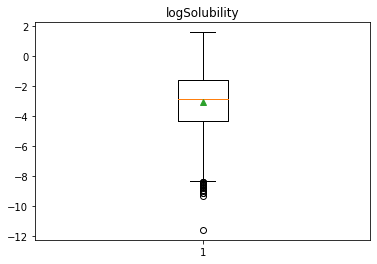

In [27]:
#Box plot of price
plt.boxplot(df_target, showmeans = True)
plt.title('logSolubility')

# Divide Dataset into Train and Test
In machine learning, we always need to separate our features into two sets:

- **Training set** which we provide to our model during training along with the answers so it can learn a mapping between the features and the target.
- **Testing set** which we use to evaluate the mapping learned by the model. The model has never seen the answers on the testing set, but instead, must make predictions using only the features. As we know the true answers for the test set, we can then compare the test predictions to the true test targets to get an estimate of how well our model will perform when deployed in the real world.

Splitting the data into a random training and testing set is simple using scikit-learn. We can set the random state of the split to ensure consistent results.

In [28]:
x_train, x_test, y_train, y_test = train_test_split(df_features_corr , df_target , test_size = 0.20,
                                                    random_state = 1234)

In [29]:
x_train.shape

(902, 185)

In [30]:
x_test.shape

(226, 185)

In [31]:
y_test.head()

181   -8.60
277   -0.60
125   -0.60
937   -0.67
444   -5.05
Name: logSolubility, dtype: float64

In [32]:
y_train.head()

828   -3.060
449   -4.571
718   -9.332
841   -2.800
248   -4.090
Name: logSolubility, dtype: float64

In [33]:
x_train.describe()

,x2,x3,x4,x5,x6,x8,x9,x10,x11,x12,x13,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x35,x36,x37,x38,x39,x40,x41,x43,x44,x45,x46,x47,x48,x49,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x128,x129,x130,x131,x132,x133,x134,x135,x136,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x183,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
count,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,902.000000,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,902.000000,902.000000,9.020000e+02,902.000000,902.000000,9.020000e+02,902.000000,9.020000e+02,902.000000,902.000000,9.020000e+02,902.000000,902.000000,902.000000,9.020000e+02,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,9.020000e+02,902.000000,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,902.000000,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,902.000000,902.000000,902.000000,9.020000e+02,902.000000,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,902.000000,902.000000,9.020000e+02,902.000000,902.000000,902.000000,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,902.000000,902.000000,9.020000e+02,902.000000,9.020000e+02,902.000000,9.020000e+02,902.000000,902.000000,902.000000,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,9.020000e+02,9.020000e+02,9.020000e+02,902.000000,902.000000
mean,0.893265,0.081020,7.836260e-02,8.019193e-02,8.983197e-02,8.518244e-02,0.097016,0.101222,1.267504e-01,1.142689e-01,0.139604,0.141113,2.633914e-01,2.381980e-01,7.761204e-03,0.249540,0.199325,1.926262e-01,4.486023e-01,2.623308e-01,0.288279,3.095276e-01,3.457862e-01,9.236603e-02,0.549825,0.416102,0.261203,5.276434e-01,0.892498,9.999990e-01,9.633355e-02,1.152068e-01,3.554199e-01,0.080994,0.111328,0.276680,0.327283,7.481181e-01,0.303081,0.608836,7.265053e-01,0.328702,7.914348e-02,0.293802,0.165421,1.286001e-01,0.248189,0.209662,0.251146,1.422265e-01,0.146878,0.168336,0.292018,0.154321,0.121537,0.094126,8.928550e-02,1.618512e-01,0.178770,2.303304e-01,1.904955e-01,0.279388,1.314450e-01,2.458075e-01,0.238243,1.970231e-01,1.027849e-01,0.254258,4.097329e-01,0.203167,0.214148,0.213293,0.125487,0.300058,0.366985,0.184641,0.164206,2.298639e-01,0.345057,0.190650,0.185760,5.301381e-05,1.764230e-01,0.197594,2.879204e-01,0.122271,3.263527e-01,

In [34]:
x_test.describe()

,x2,x3,x4,x5,x6,x8,x9,x10,x11,x12,x13,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x35,x36,x37,x38,x39,x40,x41,x43,x44,x45,x46,x47,x48,x49,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x63,x64,x65,x66,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x128,x129,x130,x131,x132,x133,x134,x135,x136,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x151,x152,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x183,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201
count,226.000000,226.000000,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,226.000000,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,2.260000e+02,226.000000,226.000000,2.260000e+02,226.000000,226.000000,226.000000,2.260000e+02,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,2.260000e+02,226.000000,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,226.000000,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,226.000000,226.000000,226.000000,2.260000e+02,226.000000,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,226.000000,226.000000,226.000000,226.000000,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,226.000000,226.000000,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,226.000000,226.000000,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000,226.000000,2.260000e+02,226.0,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,2.260000e+02,2.260000e+02,2.260000e+02,226.000000,226.000000
mean,0.875442,0.094520,0.084479,8.271054e-02,9.334660e-02,8.896148e-02,0.102085,0.101507,1.280614e-01,1.173900e-01,0.143513,0.148030,2.318459e-01,2.545382e-01,8.850224e-03,0.272685,0.207544,1.756978e-01,4.707845e-01,2.835611e-01,0.275191,3.067619e-01,3.503961e-01,9.913495e-02,0.505547,0.371519,0.253026,5.020251e-01,0.883980,9.999990e-01,1.003708e-01,0.125656,3.533728e-01,0.088901,0.126545,0.272442,0.296062,0.703899,0.273022,0.622452,0.726767,0.363861,8.830689e-02,0.272521,0.146249,1.460135e-01,0.280572,0.227463,0.293407,1.008954e-01,0.169327,0.147275,0.274368,0.140873,0.122859,0.077744,1.086266e-01,1.535780e-01,0.165180,2.028802e-01,1.884068e-01,0.284063,1.605213e-01,1.812764e-01,0.251389,1.538432e-01,7.331108e-02,0.231666,4.753778e-01,0.216479,0.210426,0.218131,0.145092,0.301513,0.403783,0.181839,0.134960,1.974835e-01,0.325596,0.180240,0.230162,5.301381e-05,1.779570e-01,0.165811,2.707811e-01,0.119828,3.644665e-01,0.125867,2.090163

# principal components(PCA)
It is a way of identifying patterns in data, and expressing the data in such a way as to highlight their similarities and differences. Since patterns in data can be hard to find in data of high dimension, where the luxury of graphical representation is not available, PCA is a powerful tool for analysing data. The other main advantage of PCA is that once you have found these patterns in the data, and you compress the data, ie. by reducing the number of dimensions, without much loss of information. 

In [35]:
#choose the minimum number of principal components such that at leastx% (98% in example below) of the variance is retained.
from sklearn.decomposition import PCA
pca = PCA(.98)
x_train_pca =  pca.fit_transform(x_train)
# To get how many principal components was chosen
print(pca.n_components_)

78


In [36]:
print(np.sum(pca.explained_variance_ratio_))

0.9803707825616839


In [37]:
# Transform test set
x_test_pca = pca.transform(x_test)

In [38]:
print(x_train_pca.shape)
print(x_test_pca.shape)

(902, 78)
(226, 78)


In [39]:
x_train_pca_df = pd.DataFrame(x_train_pca)

In [40]:
x_test_pca_df = pd.DataFrame(x_test_pca)

# Models to Evaluate
We will compare eleven different machine learning models using the great Statsmodels and Scikit-Learn library:

1- Linear Regression

2- Ridge Regression

3- Lasso Regression

4- Decision Tree Regression

5- Bagging Regression

6- Random Forest Regression

7- Gradient Boosting Regression

8 - extreme gradient boosting

9- K-Nearest Neighbors Regression
 
10- Support vector machine (SVM)

11- ADA Boost

12- Multi Layer Perceptron (MLP)


### Model 1: Linear Regression
Linear regression uses the relationship between the data-points to draw a straight line through all them. This line can be used to predict future values. In Machine Learning, predicting the future is very important.

In [41]:
#Add constant
x_train_pca_const = sm.add_constant(x_train_pca) 
x_train_pca_const_df = pd.DataFrame(x_train_pca_const)

In [42]:
#Add constant
x_test_pca_const = sm.add_constant(x_test_pca)
x_test_pca_const_df = pd.DataFrame(x_test_pca_const)

In [43]:
x_train_pca_const_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
0,1.0,1.935355,0.438559,-1.362392,-0.997353,1.867320,0.795671,-0.990134,-0.011260,-0.598345,0.318686,0.984756,-0.102377,-0.010266,0.059818,-0.477091,0.084734,0.180287,-0.121182,-0.197600,0.332982,-0.018650,-0.273035,0.038753,-0.349711,-0.020598,0.030072,-0.327467,0.062042,-0.201980,0.308564,0.043044,0.289161,0.024515,0.090248,-0.048845,0.122866,0.030938,0.220230,0.214962,-0.087863,-0.075768,-0.088926,0.273994,0.129265,-0.071895,0.116003,0.110153,0.121182,-0.058283,0.016391,-0.154958,0.138988,0.000805,-0.118962,0.026259,-0.002937,0.003137,0.133560,-0.040802,-0.124607,0.019632,0.041771,-0.095369,-0.005385,0.030551,-0.077260,0.116778,0.033174,-0.033440,-0.076327,0.036902,-0.051727,-0.031262,0.007667,-0.005179,-0.095739,0.138505,-0.019862
1,1.0,2.314752,-1.592402,1.317314,0.594390,-0.608403,-0.494702,0.444642,1.019788,-0.425044,-0.470912,-0.918056,0.184962,-1.262493,0.052913,-0.453598,-0.121991,-0.515301,0.241365,0.057700,0.469493,-0.006686,-0.023032,-0.221107,-0.294582,-0.403382,-0.749882,-0.434592,0.455589,-0.489968,0.584274,-0.099082,0.089449,-0.140190,0.288465,-0.462369,0.009459,-0.187516,-0.589584,0.254015,-0.132317,-0.008915,-0.132231,0.015139,0.276455,-0.042404,0.023256,-0.169918,0.072414,0.019246,0.468761,0.034233,0.222232,-0.103987,0.043578,0.022297,0.102533,-0.036724,-0.082666,0.005719,-0.081916,-0.028596,-0.061799,0.088719,-0.080243,-0.057103,0.099728,-0.134932,0.086667,0.079174,0.224662,0.109455,-0.132989,0.057414,0.069326,0.004465,-0.045864,-0.036875,0.005573
2,1.0,-0.823054,0.679614,1.360839,1.462566,0.853656,1.240222,0.387817,0.496472,0.075220,0.148320,-0.433981,-0.398594,-0.156809,0.299885,0.607520,-0.148700,-0.069453,-0.055025,0.140815,0.142779,-0.273080,0.490612,-0.229460,0.085767,-0.479639,0.021568,0.270815,0.195604,0.105140,-0.222025,-0.400794,0.164437,-0.399765,-0.049727,0.445424,0.023653,0.458026,0.017643,-0.002749,0.013573,-0.606635,-0.168486,0.058093,-0.007651,-0.239508,-0.025146,-0.321167,-0.322254,-0.203382,0.131234,-0.110807,-0.224503,-0.002152,-0.175948,-0.127095,0.047915,0.109827,0.046030,-0.105747,0.079137,-0.122268,0.116554,-0.128666,0.160866,0.286913,-0.165471,0.081936,0.106104,-0.016473,-0.022788,-0.071842,-0.013323,0.130985,0.099528,-0.281841,-0.086832,0.069089,-0.155035
3,1.0,-1.428580,0.514356,-0.378949,0.472191,0.527040,0.516049,0.178993,-0.168979,0.655711,0.077615,0.497752,-0.016247,-0.191652,0.082070,0.075773,-0.297392,-0.526344,-0.257446,-0.041980,-0.280058,0.029005,-0.195707,-0.138391,0.259680,0.151476,-0.035946,0.165862,0.124854,-0.031405,0.038602,0.096939,-0.026912,-0.039548,-0.077388,-0.031060,0.034856,0.082234,0.022368,-0.025244,0.195873,0.162818,-0.056074,-0.037846,-0.021423,0.007063,0.127696,0.049065,0.012269,-0.067053,-0.036673,-0.003411,-0.006460,0.064652,0.047078,0.041728,-0.029930,-0.022758,-0.036689,0.009407,-0.062057,-0.070596,0.057519,-0.013213,0.069087,-0.075468,-0.013537,0.009400,0.009775,0.020420,-0.017699,0.000333,0.015553,-0.046714,0.057894,0.054255,0.046369,-0.031999,0.029289
4,1.0,0.374414,-0.146934,1.852581,1.155619,0.859796,-1.166958,0.683245,-0.306142,-0.291658,0.276038,0.684893,0.836587,-0.555323,-0.703987,-0.063347,-0.629581,0.281226,0.689115,-0.330519,-0.472301,-0.055535,0.037577,-0.062488,-0.360499,0.348969,-0.263597,-0.268363,-0.078642,0.486301,-0.077827,-0.357517,-0.097962,0.315606,0.333816,-0.215238,0.151463,-0.139030,0.067037,0.324215,0.545283,-0.208140,0.088993,0.294816,-0.262481,-0.082729,0.156891,0.092710,0.400043,0.260519,0.184149,-0.161705,-0.079614,0.008803,-0.104095,-0.052741,-0.237898,0.153924,0.346156,-0.138299,-0.121555,0.236689,0.206471,0.018977,0.249961,0.220891,-0.112748,0.287773,-0.306210,0.424920,0.181341,-0.030313,-0.282531,0.438953,0.080533,0.032724,-0.188993,0.059864,-0.048683


In [44]:
#Regression Model
lm_pca_parameter = sm.OLS(y_train, x_train_pca_const).fit()
lm_pca_parameter.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          logSolubility   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     86.30
Date:                Sat, 19 Feb 2022   Prob (F-statistic):               0.00
Time:                        14:58:17   Log-Likelihood:                -946.33
No. Observations:                 902   AIC:                             2051.
Df Residuals:                     823   BIC:                             2430.
Df Model:                          78                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.0097      0.024   -124.973      0.000      -3.057      -2.962
x1            -0.2361      0.019    -12.619      0.000      -0.273      -0.199
x2            -0.2507      0.024    -10.256      0.000      -0.299      -0.203
x3            -1.5285      0.027    -57.316      0.000      -1.581      -1.476
x4            -0.4111      0.032    -12.834      0.000      -0.474      -0.348
x5            -0.6609      0.034    -19.228      0.000      -0.728      -0.593
x6            -1.0293      0.038    -27.445      0.000      -1.103      -0.956
x7            -0.8778      0.040    -22.078      0.000      -0.956      -0.800
x8             0.1876      0.042      4.491      0.000       0.106       0.270
x9             0.0763      0.046      1.653      0.099      -0.014       0.167
x10            0.6213      0.049     12.641      0.000       0.525       0.718
x11           -0.2144      0.053     -4.017      0.000      -0.319      -0.110
x12            0.6851      0.055     12.468      0.000       0.577       0.793
x13           -0.0056      0.057     -0.098      0.922      -0.118       0.107
x14            0.0629      0.060      1.055      0.292      -0.054       0.180
x15            0.2199      0.064      3.440      0.001       0.094       0.345
x16            0.5146      0.066      7.804      0.000       0.385       0.644
x17           -0.4327      0.068     -6.373      0.000      -0.566      -0.299
x18           -0.7557      0.071    -10.701      0.000      -0.894      -0.617
x19            0.1807      0.073      2.474      0.014       0.037       0.324
x20            0.1687      0.075      2.253      0.024       0.022       0.316
x21            0.4451      0.076      5.836      0.000       0.295       0.595
x22           -0.1493      0.077     -1.942      0.052      -0.300       0.002
x23           -0.0320      0.078     -0.411      0.681      -0.185       0.121
x24            0.9644      0.085     11.389      0.000       0.798       1.131
x25           -0.2824      0.087     -3.235      0.001      -0.454      -0.111
x26           -0.5743      0.088     -6.544      0.000      -0.747      -0.402
x27            0.0102      0.091      0.112      0.911      -0.168       0.189
x28           -0.1219      0.092     -1.321      0.187      -0.303       0.059
x29           -0.2136      0.097     -2.198      0.028      -0.404      -0.023
x30           -0.3258      0.100     -3.265      0.001      -0.522      -0.130
x31           -0.5380      0.101     -5.326      0.000      -0.736      -0.340
x32           -0.4106      0.105     -3.921      0.000      -0.616      -0.205
x33            0.6538      0.108      6.081      0.000       0.443       0.865
x34           -0.1550      0.111     -1.394      0.164      -0.373       0.063
x35           -0.2945      0.112     -2.636      0.009      -0.514      -0.075
x3

### Check Assumptions of Regression:

<AxesSubplot:ylabel='Probability'>

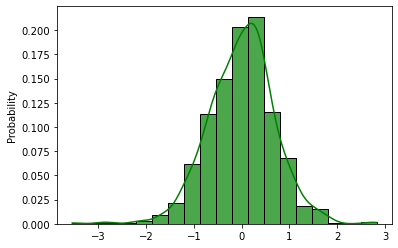

In [45]:
#Normality of residuals

#Plot histogram of residuals
sns.histplot(lm_pca_parameter.resid, stat = 'probability' ,
            kde = True, alpha = 0.7, color = 'green',
             bins = np.linspace(min(lm_pca_parameter.resid), max(lm_pca_parameter.resid), 20))

### QQ-Plot :
When the quantiles of two variables are plotted against each other, then the plot obtained is known as quantile – quantile plot or qqplot. This plot provides a summary of whether the distributions of two variables are similar or not with respect to the locations.

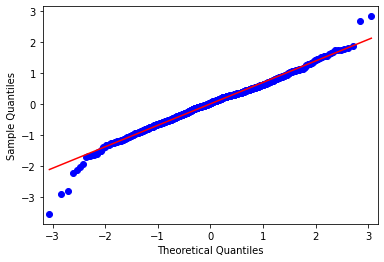

In [46]:
#QQ-plot
qqplot_lm_pca_parameter = sm.qqplot(lm_pca_parameter.resid, line = 's')
plt.show()

- Most point of quantiles lie on or close to straight line at an angle of 45 degree from x – axis. It indicates that two samples have similar distributions.

### Test for Skewness and Kurtosis:

In [47]:
#Good for sample size > 25

#Jarque-Bera Test (Skewness = 0 ?)
#H0: the data is normally distributed
#p-value < 0.05 reject normality assumption

#Omnibus K-squared normality test
#The Omnibus test combines the random variables for Skewness and Kurtosis into a single test statistic
#H0: the data is normally distributed
#p-value < 0.05 reject normality assumption

print(lm_pca_parameter.summary())

                            OLS Regression Results                            
Dep. Variable:          logSolubility   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     86.30
Date:                Sat, 19 Feb 2022   Prob (F-statistic):               0.00
Time:                        14:58:21   Log-Likelihood:                -946.33
No. Observations:                 902   AIC:                             2051.
Df Residuals:                     823   BIC:                             2430.
Df Model:                          78                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.0097      0.024   -124.973      0.0

- Residuals are not Normally Distributed!

### Heteroskedasticity
In statistics, heteroskedasticity (or heteroscedasticity) happens when the standard errors of a variable, monitored over a specific amount of time, are non-constant.
Heteroskedasticity is a violation of the assumptions for linear regression modeling.Heteroscedaticy makes a regression model less robust. Essentially, the predicted errors vary for different ranges of the independent variable, suggesting an imperfect model.

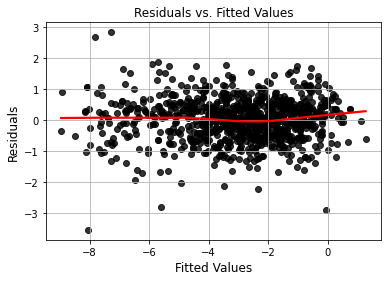

In [48]:
#Residuals vs. Fitted Values
sns.regplot(x = lm_pca_parameter.fittedvalues, y = lm_pca_parameter.resid, lowess = True, 
                       scatter_kws = {"color": "black"}, line_kws = {"color": "red"})
plt.xlabel('Fitted Values', fontsize = 12)
plt.ylabel('Residuals', fontsize = 12)
plt.title('Residuals vs. Fitted Values', fontsize = 12)
plt.grid()

Cook's distance, an estimate of how much predicted values would change if the model were re-estimated with that point eliminated from the data.

In [49]:
##Check Cook's distance
sum(lm_pca_parameter.get_influence().summary_frame().cooks_d > 1)

0

In [50]:
#Check Multicollinearity
#Import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

calc_vif(x_train_pca_const_df.iloc[:, 1:])
#If VIF > 10 then multicollinearity is high

,variables,VIF
0,1,1.0
1,2,1.0
2,3,1.0
3,4,1.0
4,5,1.0
5,6,1.0
6,7,1.0
7,8,1.0
8,9,1.0
9,10,1.0


#### Model 1: Prediction on Test dataset

In [51]:
pred_lm_pca_parameter = lm_pca_parameter.predict(x_test_pca_const)

In [52]:
#Absolute error
abs_err_lm_pca_parameter = abs(y_test - pred_lm_pca_parameter)

In [53]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = pd.DataFrame({'Mean of AbsErrors':    abs_err_lm_pca_parameter.mean(),
                           'Median of AbsErrors' : abs_err_lm_pca_parameter.median(),
                           'SD of AbsErrors' :     abs_err_lm_pca_parameter.std(),
                           'IQR of AbsErrors':     iqr(abs_err_lm_pca_parameter),
                           'Min of AbsErrors':     abs_err_lm_pca_parameter.min(),
                           'Max of AbsErrors':     abs_err_lm_pca_parameter.max(),
                            'R^2-score' : metrics.r2_score(y_test, pred_lm_pca_parameter) }, index = ['LM Reg PCA'])
model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.00125,3.087932,0.876103


- R^2 indicates the proportion of data points which lie within the line created by the regression equation. A higher value of R^2 is desirable as it indicates better results.

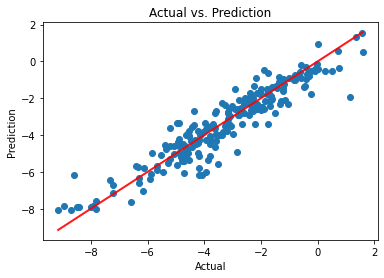

In [54]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_lm_pca_parameter)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, 'k', alpha = 0.9, linewidth = 2, color = 'red')

### Model 2 : linear Regression for All Variables

In [55]:
#Add constant
x_train_const = sm.add_constant(x_train)
x_train_const_df = pd.DataFrame(x_train_const)

In [56]:
#Add constant
x_test_const = sm.add_constant(x_test) 
x_test_const_df = pd.DataFrame(x_test_const)

In [57]:
#Regression Model
lm_parameter_all = sm.OLS(y_train, x_train_const).fit()
lm_parameter_all.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          logSolubility   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.913
Method:                 Least Squares   F-statistic:                     59.87
Date:                Sat, 19 Feb 2022   Prob (F-statistic):               0.00
Time:                        14:58:40   Log-Likelihood:                -755.13
No. Observations:                 902   AIC:                             1834.
Df Residuals:                     740   BIC:                             2613.
Df Model:                         161                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x2            -0.0331      0.287     -0.115      0.908      -0.596       0.530
x3            -0.3426      0.930     -0.369      0.713      -2.168       1.482
x4            -0.0143      3.876     -0.004      0.997      -7.624       7.595
x5            10.2253      4.444      2.301      0.022       1.501      18.950
x6             2.2139      4.227      0.524      0.601      -6.084      10.512
x8            -7.0536      2.860     -2.466      0.014     -12.669      -1.438
x9             2.8422      1.732      1.641      0.101      -0.558       6.242
x10           -2.0497      1.262     -1.624      0.105      -4.527       0.428
x11            1.7038      0.635      2.685      0.007       0.458       2.950
x12            0.8329      1.017      0.819      0.413      -1.163       2.829
x13           -1.5963      0.685     -2.331      0.020      -2.941      -0.252
x15            0.3938      0.651      0.605      0.545      -0.884       1.672
x16           -0.1986      0.236     -0.843      0.400      -0.661       0.264
x17           -0.7581      0.346     -2.188      0.029      -1.438      -0.078
x18           -1.1722      0.455     -2.576      0.010      -2.066      -0.279
x19            0.0769      0.252      0.306      0.760      -0.417       0.571
x20            0.0125      0.203      0.062      0.951      -0.386       0.411
x21            0.2884      0.198      1.460      0.145      -0.099       0.676
x22            0.0638      0.093      0.687      0.492      -0.118       0.246
x23           -0.0224      0.122     -0.183      0.855      -0.263       0.218
x24            0.2900      0.128      2.265      0.024       0.039       0.541
x25           -0.0894      0.161     -0.555      0.579      -0.405       0.227
x26           -0.1172      0.206     -0.568      0.570      -0.522       0.288
x27           -2.7442      1.123     -2.443      0.015      -4.949      -0.539
x28           -0.0662      0.182     -0.364      0.716      -0.423       0.291
x29            0.2862      0.194      1.474      0.141      -0.095       0.667
x30           -0.4396      0.204     -2.153      0.032      -0.840      -0.039
x31         9.823e-05      0.227      0.000      1.000      -0.445       0.446
x32            1.2011      0.666      1.802      0.072      -0.107       2.509
x35           -0.8680      0.610     -1.422      0.155      -2.066       0.330
x36           -3.1425      1.514     -2.075      0.038      -6.116      -0.169
x37            0.2356      0.615      0.383      0.702      -0.972       1.443
x38           -0.5824      0.232     -2.507      0.012      -1.038      -0.126
x39            1.8246      4.193      0.435      0.664      -6.407      10.056
x40            0.8011      0.427      1.878      0.061      -0.036       1.639
x41            1.3272      0.784      1.693      0.091      -0.212       2.866
x4

- There are strong multicollinearity problems!

<AxesSubplot:ylabel='Probability'>

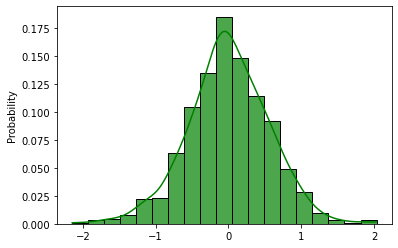

In [58]:
#Check Assumptions of Regression
#Normality of residuals

#Plot histogram of residuals
sns.histplot(lm_parameter_all.resid, stat = 'probability' ,
            kde = True, alpha = 0.7, color = 'green',
             bins = np.linspace(min(lm_parameter_all.resid), max(lm_parameter_all.resid), 20))

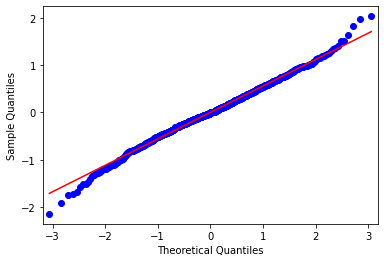

In [59]:
#QQ-plot
qqplot_lm_parameter_all = sm.qqplot(lm_parameter_all.resid, line = 's')
plt.show()

- All point of quantiles lie on or close to straight line at an angle of 45 degree from x – axis. It indicates that two samples have similar distributions.Here the points are lying nearly on the straight line.

### Hetroscedasticity 

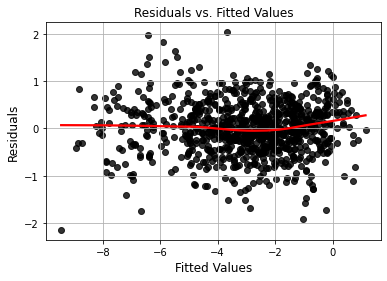

In [60]:
#Residuals vs. Fitted Values
sns.regplot(x = lm_parameter_all.fittedvalues, y = lm_parameter_all.resid, lowess = True, 
                       scatter_kws = {"color": "black"}, line_kws = {"color": "red"})
plt.xlabel('Fitted Values', fontsize = 12)
plt.ylabel('Residuals', fontsize = 12)
plt.title('Residuals vs. Fitted Values', fontsize = 12)
plt.grid()

In [61]:
#Check Multicollinearity
#Import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

calc_vif(x_train_const_df.iloc[:, 1:])

,variables,VIF
0,x3,38.566180
1,x4,823.257501
2,x5,1127.212479
3,x6,1092.684426
4,x8,541.063721
5,x9,215.758590
6,x10,151.187327
7,x11,49.559777
8,x12,122.977215
9,x13,71.039211


- If VIF > 10 then multicollinearity is high

In [62]:
#Test for Skewness and Kurtosis
#Good for sample size > 25

#Jarque-Bera Test (Skewness = 0 ?)
#H0: the data is normally distributed
#p-value < 0.05 reject normality assumption

#Omnibus K-squared normality test
#The Omnibus test combines the random variables for Skewness and Kurtosis into a single test statistic
#H0: the data is normally distributed
#p-value < 0.05 reject normality assumption
print(lm_parameter_all.summary())

                            OLS Regression Results                            
Dep. Variable:          logSolubility   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.913
Method:                 Least Squares   F-statistic:                     59.87
Date:                Sat, 19 Feb 2022   Prob (F-statistic):               0.00
Time:                        14:58:48   Log-Likelihood:                -755.13
No. Observations:                 902   AIC:                             1834.
Df Residuals:                     740   BIC:                             2613.
Df Model:                         161                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x2            -0.0331      0.287     -0.115      0.9

#### Model 2 : Prediction on the Datasets

In [63]:
pred_lm_parameter_all = lm_parameter_all.predict(x_test_const)

In [64]:
#Absolute error
abs_err_lm_parameter_all = abs(y_test - pred_lm_parameter_all)

In [65]:
#Absolute error mean, median, sd, IQR, max, min
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_lm_parameter_all.mean(),
                                             'Median of AbsErrors' : abs_err_lm_parameter_all.median(),
                                             'SD of AbsErrors' :     abs_err_lm_parameter_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_lm_parameter_all),
                                             'Min of AbsErrors':     abs_err_lm_parameter_all.min(),
                                             'Max of AbsErrors':     abs_err_lm_parameter_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_lm_parameter_all)}, index = ['LM Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656


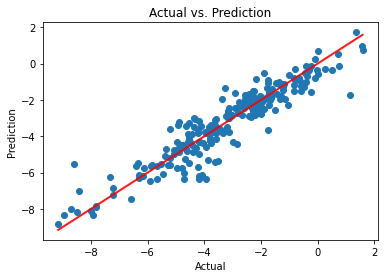

In [66]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_lm_parameter_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, 'k', alpha = 0.9, linewidth = 2, color = 'red')

Conclusion:

If select variables based on t-test results, limited number of variables will be selected.

t-test results are not reliable for predictors selection.

### Model 3 : Ridge Regression
Ridge regression is a method we can use to fit a regression model when multicollinearity is present in the data.
Ridge Regression:

The goal is to optimize:

SSE + lambda * Sum( beta_i ^ 2)

lambda => 0,  a tuning parameter

In [67]:
lambda_grid = 10 ** np.linspace(5, -2, 100)

In [71]:
#K-fold Cross Validation to Choose the Best Model
ridgecv_pca = RidgeCV(alphas = lambda_grid, cv = 10, normalize = True)
ridgecv_pca.fit(x_train_pca_const, y_train)
ridgecv_pca.alpha_

0.026560877829466895

####  Model 3 :Prediction on the Datasets 

In [72]:
ridgepca = Ridge(alpha = ridgecv_pca.alpha_, normalize = True)
ridgepca.fit(x_train_pca_const, y_train)
pred_ridge_pca = ridgepca.predict(x_test_pca_const)

In [73]:
#Absolute error
abs_err_ridge_pca = abs(y_test - pred_ridge_pca)

In [74]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_ridge_pca.mean(),
                                             'Median of AbsErrors' : abs_err_ridge_pca.median(),
                                             'SD of AbsErrors' :     abs_err_ridge_pca.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_ridge_pca),
                                             'Min of AbsErrors':     abs_err_ridge_pca.min(),
                                             'Max of AbsErrors':     abs_err_ridge_pca.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_ridge_pca)}, index = ['Ridge Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709


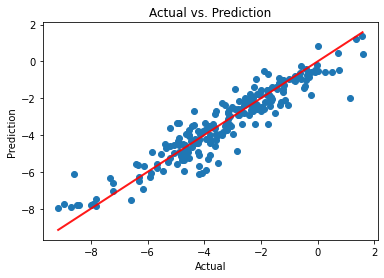

In [75]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_ridge_pca)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 4 : Ridge Regression For All variables

In [81]:
#K-fold Cross Validation to Choose the Best Model
ridgecv = RidgeCV(alphas = lambda_grid, cv = 10, normalize = True)
ridgecv.fit(x_train_const, y_train)
ridgecv.alpha_

5.72236765935022

### Model 4 : Prediction on the Test Datasets

In [82]:
ridgereg = Ridge(alpha = ridgecv.alpha_, normalize = True)
ridgereg.fit(x_train_const, y_train)
pred_ridge = ridgereg.predict(x_test_const)

In [83]:
#Absolute error
abs_err_ridge = abs(y_test - pred_ridge)

In [84]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_ridge.mean(),
                                             'Median of AbsErrors' : abs_err_ridge.median(),
                                             'SD of AbsErrors' :     abs_err_ridge.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_ridge),
                                             'Min of AbsErrors':     abs_err_ridge.min(),
                                             'Max of AbsErrors':     abs_err_ridge.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_ridge)}, index = ['Ridge Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762


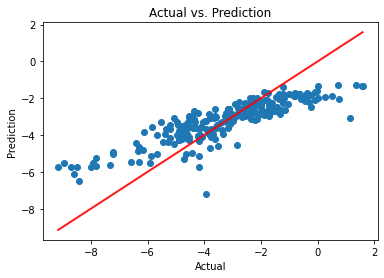

In [85]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_ridge)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 5: Lasso Regression
Lasso Regression:

The goal is to optimize:

   SSE + lambda * Sum(abs(beta_i))
   
   lambda => 0,  a tuning parameter

In [86]:
lambda_grid = 10 ** np.linspace(1, -3, 100)

In [88]:
#K-fold Cross Validation to Choose the Best Model
lassocv_pca = LassoCV(alphas = lambda_grid, cv = 10)
lassocv_pca.fit(x_train_pca_const, y_train)
lassocv_pca.alpha_

0.001

In [89]:
#Best Model Coefs:
lassocv_pca.coef_

array([ 0.        , -0.2127302 , -0.22021573, -1.49527163, -0.37119234,
       -0.61806126, -0.98251688, -0.82818116,  0.13552966,  0.01872273,
        0.55998944, -0.14782741,  0.6165516 , -0.        ,  0.        ,
        0.1401508 ,  0.43239094, -0.348018  , -0.6676479 ,  0.08961792,
        0.0753131 ,  0.34994891, -0.05343222, -0.        ,  0.8588354 ,
       -0.17354758, -0.464825  ,  0.        , -0.00685509, -0.09239451,
       -0.20135175, -0.41203297, -0.28001463,  0.51968953, -0.016373  ,
       -0.15514816,  0.97344895, -0.41431581,  0.        ,  0.        ,
        0.36062075,  0.32001683, -0.55254016,  0.        , -0.        ,
       -0.1158225 , -0.05520504,  0.18460929, -0.48720286,  0.10544381,
        0.        , -0.34598328,  1.09732877,  0.34286885,  0.06501335,
        0.25242866, -0.45956176,  0.26387346,  0.17884971,  0.98961639,
       -0.        ,  0.3654832 ,  0.22491794, -0.        ,  0.        ,
        0.28197632,  0.09892243,  0.43342543,  0.        ,  0.35

In [90]:
lassoreg_pca = Lasso(alpha = lassocv_pca.alpha_)
lassoreg_pca.fit(x_train_pca_const, y_train)
pred_lasso_pca = lassoreg.predict(x_test_pca_const)

In [91]:
#Absolute error
abs_err_lasso_pca = abs(y_test - pred_lasso_pca)

In [92]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_lasso_pca.mean(),
                                             'Median of AbsErrors' : abs_err_lasso_pca.median(),
                                             'SD of AbsErrors' :     abs_err_lasso_pca.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_lasso_pca),
                                             'Min of AbsErrors':     abs_err_lasso_pca.min(),
                                             'Max of AbsErrors':     abs_err_lasso_pca.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_lasso_pca)}, index = ['Lasso Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487


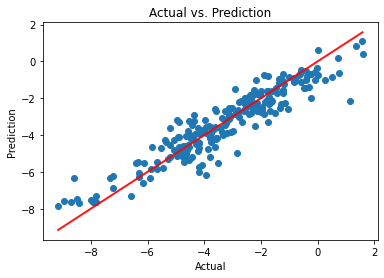

In [93]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_lasso_pca)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 6 : Lasso Reg For All variables

In [95]:
#K-fold Cross Validation to Choose the Best Model
lassocv = LassoCV(alphas = lambda_grid, cv = 10, normalize = True)
lassocv.fit(x_train_const, y_train)
lassocv.alpha_

0.001

### Model 6: Prediction on the Test Dataset

In [97]:
lassoreg = Lasso(alpha = lassocv.alpha_, normalize = True)
lassoreg.fit(x_train_const, y_train)
pred_lasso = lassoreg.predict(x_test_const)

In [98]:
#Absolute error
abs_err_lasso = abs(y_test - pred_lasso)

In [101]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_lasso.mean(),
                                             'Median of AbsErrors' : abs_err_lasso.median(),
                                             'SD of AbsErrors' :     abs_err_lasso.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_lasso),
                                             'Min of AbsErrors':     abs_err_lasso.min(),
                                             'Max of AbsErrors':     abs_err_lasso.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_lasso)}, index = ['Lasso Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485


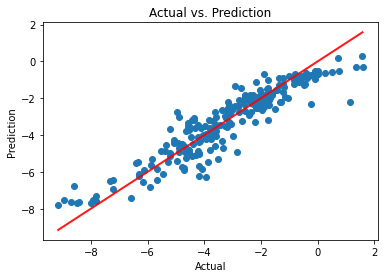

In [102]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_lasso)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 7: Decision Tree For All Variables:
A Decision Tree is a Flow Chart, and can help you make decisions based on previous experience.

In [103]:
#K-Fold Cross Validation for Choosing Hyper-parameters
#Create Hyper-parameters grid
import itertools
max_depth = [5, 7, 10 ,15 ]
min_samples_leaf = [2 , 5, 10, 15 ]
ccp_alpha = [0.0001, 0.001, 0.01 , 0.015]
grid = list(itertools.product(max_depth, min_samples_leaf, ccp_alpha))
grid = pd.DataFrame(data = grid, index = range(1, 65), columns = ['max_depth', 'min_samples_leaf', 'ccp_alpha'])
grid

,max_depth,min_samples_leaf,ccp_alpha
1,5,2,0.0001
2,5,2,0.0010
3,5,2,0.0100
4,5,2,0.0150
5,5,5,0.0001
6,5,5,0.0010
7,5,5,0.0100
8,5,5,0.0150
9,5,10,0.0001
10,5,10,0.0010


In [104]:
cv_errors = pd.DataFrame(index = range(1, k + 1), columns = range(1, 65))

In [105]:
cv_errors

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [106]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        reg_tree_all = DecisionTreeRegressor(max_depth = grid.loc[i, 'max_depth'], 
                                         min_samples_leaf = grid.loc[i, 'min_samples_leaf'], 
                                         ccp_alpha = grid.loc[i, 'ccp_alpha'])
        tree_res_all = reg_tree_all.fit(x_train.iloc[folds != j, :], y_train[folds != j])
        pred_all = tree_res_all.predict(x_train.iloc[folds == j, :])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_all) ** 2).mean()

In [107]:
cv_errors.mean(axis = 0)

1     0.769845
2     0.766413
3     0.764872
4     0.770807
5     0.752457
6     0.751305
7     0.761406
8     0.768672
9     0.737041
10    0.730839
11    0.755909
12    0.774355
13    0.749280
14    0.754593
15    0.775610
16    0.795548
17    0.787759
18    0.815292
19    0.748067
20    0.766980
21    0.787917
22    0.798582
23    0.756946
24    0.766633
25    0.745802
26    0.747731
27    0.729772
28    0.765559
29    0.749179
30    0.746803
31    0.746606
32    0.779601
33    0.829105
34    0.815889
35    0.747875
36    0.772275
37    0.786582
38    0.811064
39    0.754531
40    0.764566
41    0.749191
42    0.747355
43    0.735414
44    0.764077
45    0.752154
46    0.743997
47    0.733586
48    0.784722
49    0.855883
50    0.820755
51    0.741644
52    0.771122
53    0.792214
54    0.793254
55    0.755292
56    0.764566
57    0.744471
58    0.743903
59    0.734261
60    0.765230
61    0.743640
62    0.745989
63    0.742757
64    0.779409
dtype: float64

In [108]:
cv_errors.mean(axis = 0).argmin() + 1

27

In [109]:
#Best Model
grid.loc[cv_errors.mean(axis = 0).argmin() + 1,:]

max_depth            7.00
min_samples_leaf    10.00
ccp_alpha            0.01
Name: 27, dtype: float64

[Text(782.265625, 1009.5428571428572, 'x48 <= 0.353\nmse = 4.381\nsamples = 902\nvalue = -3.01'),
 Text(421.40625, 854.2285714285715, 'x9 <= 0.002\nmse = 1.747\nsamples = 582\nvalue = -1.873'),
 Text(193.75, 698.9142857142858, 'x48 <= 0.151\nmse = 1.193\nsamples = 218\nvalue = -0.981'),
 Text(116.25, 543.6, 'x27 <= 0.001\nmse = 0.807\nsamples = 159\nvalue = -0.574'),
 Text(77.5, 388.28571428571433, 'x48 <= 0.079\nmse = 0.642\nsamples = 118\nvalue = -0.32'),
 Text(38.75, 232.97142857142865, 'mse = 0.311\nsamples = 44\nvalue = 0.28'),
 Text(116.25, 232.97142857142865, 'x41 <= 0.036\nmse = 0.496\nsamples = 74\nvalue = -0.678'),
 Text(77.5, 77.65714285714284, 'mse = 0.204\nsamples = 16\nvalue = -1.416'),
 Text(155.0, 77.65714285714284, 'mse = 0.385\nsamples = 58\nvalue = -0.474'),
 Text(155.0, 388.28571428571433, 'mse = 0.561\nsamples = 41\nvalue = -1.305'),
 Text(271.25, 543.6, 'x61 <= 0.0\nmse = 0.587\nsamples = 59\nvalue = -2.077'),
 Text(232.5, 388.28571428571433, 'mse = 0.248\nsamples

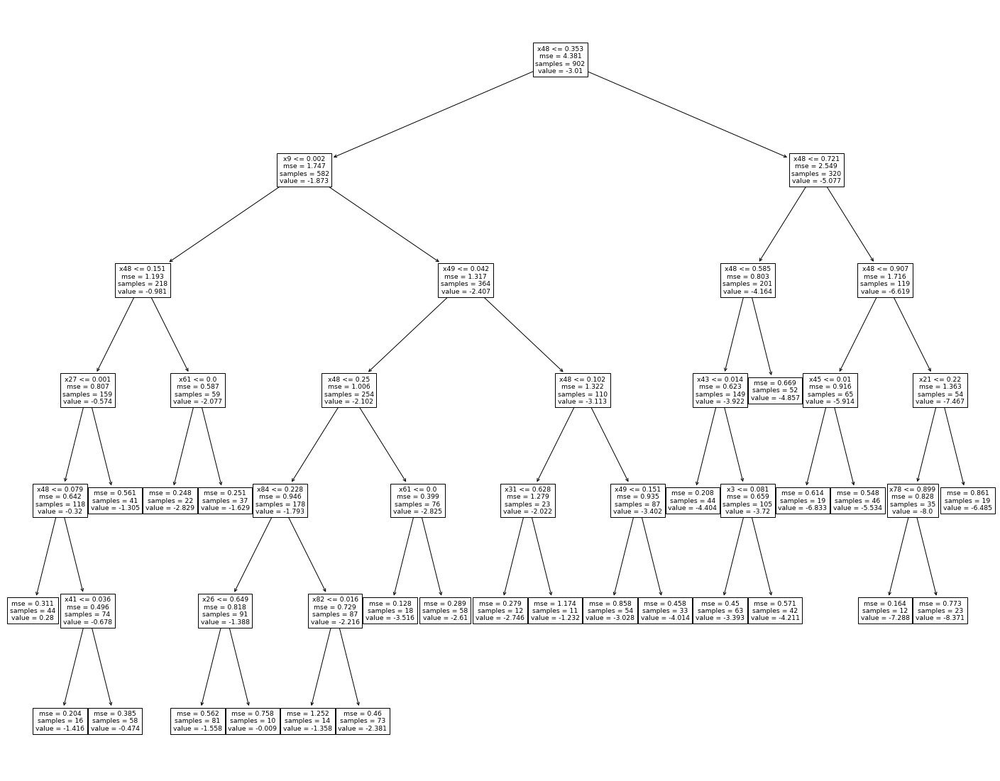

In [110]:
#The Best Decision Tree Model Using All Variables
reg_tree_all = DecisionTreeRegressor(max_depth = 7, min_samples_leaf = 10, ccp_alpha = 0.01)
tree_res_all = reg_tree_all.fit(x_train, y_train)
#Plot the Tree
from sklearn.tree import plot_tree
fig = plt.figure(figsize = (25, 20))
plot_tree(tree_res_all, feature_names = x_train.columns)

####  model 8: Prediction on the Test Dataset

In [111]:
pred_tree_all = tree_res_all.predict(x_test)

In [112]:
#Absolute error
abs_err_tree_all = abs(y_test - pred_tree_all)

In [113]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_tree_all.mean(),
                                             'Median of AbsErrors' : abs_err_tree_all.median(),
                                             'SD of AbsErrors' :     abs_err_tree_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_tree_all),
                                             'Min of AbsErrors':     abs_err_tree_all.min(),
                                             'Max of AbsErrors':     abs_err_tree_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_tree_all)}, index = ['Decision Tree Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841


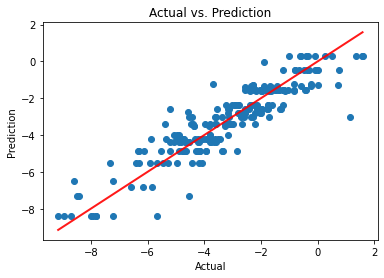

In [114]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_tree_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 9: Bagging
Bagging is an ensemble machine learning algorithm that combines the predictions from many decision trees.
Ensemble machine learning methods come in 2 different flavours – bagging and boosting.

- Bagging is a technique in which many predictors are trained independently of one another and then they are aggregated afterwards using an average (majority vote/mode, mean, weighted mean). Random forests are an example of bagging.
- Boosting is a technique in which the predictors are trained sequentially (the error of one stage is passed as input into the next stage)

### Model 9: Prediction on Test Dataset

In [115]:
from sklearn.ensemble import RandomForestRegressor

In [116]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        bagging_reg = RandomForestRegressor(max_features = 78 , max_depth = grid.loc[i, 'max_depth'], 
                                         min_samples_leaf = grid.loc[i, 'min_samples_leaf'], 
                                         ccp_alpha = grid.loc[i, 'ccp_alpha'] , n_estimators = 1000)
        bagging_res = bagging_reg.fit(x_train_pca_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred_bagging = bagging_res.predict(x_train_pca_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_bagging) ** 2).mean()

In [117]:
#Best Model
grid.loc[cv_errors.mean(axis = 0).argmin() + 1,:]

max_depth           15.0000
min_samples_leaf     2.0000
ccp_alpha            0.0001
Name: 49, dtype: float64

In [118]:
bagging_reg_pca = RandomForestRegressor(max_features = 78, max_depth = 15 ,random_state = 123,
                                    min_samples_leaf = 2 ,
                                    ccp_alpha = 0.0001 , n_estimators = 1000)

In [119]:
bagging_res_pca = bagging_reg_pca.fit(x_train_pca, y_train)
pred_bagging_pca = bagging_res_pca.predict(x_test_pca)

In [120]:
#Absolute error
abs_err_bagging = abs(y_test - pred_bagging_pca)

In [121]:
#Absolute error mean, median, sd, IQR, max, min
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_bagging.mean(),
                                             'Median of AbsErrors' : abs_err_bagging.median(),
                                             'SD of AbsErrors' :     abs_err_bagging.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_bagging),
                                             'Min of AbsErrors':     abs_err_bagging.min(),
                                             'Max of AbsErrors':     abs_err_bagging.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_tree_all)}, index = ['Bagging Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841


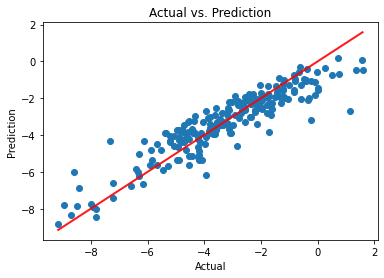

In [122]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_bagging_pca)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 10 : Bagging All Variables

In [123]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        bagging_reg_all = RandomForestRegressor(max_features = 184 , max_depth = grid.loc[i, 'max_depth'], 
                                         min_samples_leaf = grid.loc[i, 'min_samples_leaf'], 
                                         ccp_alpha = grid.loc[i, 'ccp_alpha'] , n_estimators = 500)
        bagging_res_all = bagging_reg_all.fit(x_train_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred_bagging_all = bagging_res_all.predict(x_train_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_bagging_all) ** 2).mean()

In [124]:
#Best Model
grid.loc[cv_errors.mean(axis = 0).argmin() + 1,:]

max_depth           15.0000
min_samples_leaf     2.0000
ccp_alpha            0.0001
Name: 49, dtype: float64

In [125]:
#Bagging: Using All Features
bagging_reg_all_ = RandomForestRegressor(max_features = 184,
                                        min_samples_leaf = 2 ,
                                        max_depth =15 ,
                                        ccp_alpha = 0.0001 ,random_state = 123, n_estimators = 500)
bagging_res_all_ = bagging_reg_all_.fit(x_train, y_train)
pred_bagging_all_ = bagging_res_all_.predict(x_test)

In [126]:
#Absolute error
abs_err_bagging_all = abs(y_test - pred_bagging_all_)

In [127]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_bagging_all.mean(),
                                             'Median of AbsErrors' : abs_err_bagging_all.median(),
                                             'SD of AbsErrors' :     abs_err_bagging_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_bagging_all),
                                             'Min of AbsErrors':     abs_err_bagging_all.min(),
                                             'Max of AbsErrors':     abs_err_bagging_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_bagging_all_)}, index = ['Bagging Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969


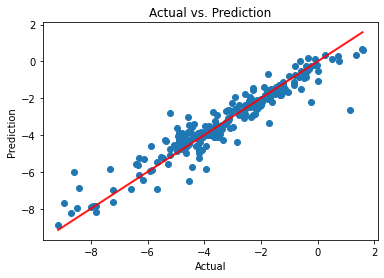

In [128]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_bagging_all_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 11 : Random Forest 

In [129]:
#max_features = p/3
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        rf_reg_pca = RandomForestRegressor(max_features =26 , max_depth = grid.loc[i, 'max_depth'], 
                                         min_samples_leaf = grid.loc[i, 'min_samples_leaf'], 
                                         ccp_alpha = grid.loc[i, 'ccp_alpha'] ,  n_estimators = 1000)
        rf_res_pca = rf_reg_pca.fit(x_train_pca_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred_rf_pca = rf_res_pca.predict(x_train_pca_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_rf_pca) ** 2).mean()

In [130]:
#Best Model
grid.loc[cv_errors.mean(axis = 0).argmin() + 1,:]

max_depth           15.0000
min_samples_leaf     2.0000
ccp_alpha            0.0001
Name: 49, dtype: float64

In [131]:
#Random Forest
rf_reg =RandomForestRegressor(max_features = 26,
                                        min_samples_leaf = 2 ,
                                        max_depth =15 ,
                                        ccp_alpha = 0.0001 ,random_state = 123, n_estimators = 1000)
rf_res = rf_reg.fit(x_train_pca, y_train)

In [230]:
Importance = pd.DataFrame({'Importance':rf_res.feature_importances_ * 100}, 
                          index = x_test_pca_const_df.iloc[:, 1:].columns)
Importance.sort_values(by = 'Importance', axis = 0, ascending = False)

,Importance
3,31.221160
6,10.529580
7,4.204461
2,3.911653
5,3.854954
1,3.757647
18,2.633990
10,2.305666
4,1.777094
41,1.173883


- importance is based upon the mean decrease of accuracy in predictions on the out of bag samples when a given variable is excluded from the model. 

#### Model 11: Prediction on the  Test Dataset

In [134]:
pred_rf = rf_res.predict(x_test_pca)

In [135]:
#Absolute error
abs_err_rf = abs(y_test - pred_rf)

In [136]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_rf.mean(),
                                             'Median of AbsErrors' : abs_err_rf.median(),
                                             'SD of AbsErrors' :     abs_err_rf.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_rf),
                                             'Min of AbsErrors':     abs_err_rf.min(),
                                             'Max of AbsErrors':     abs_err_rf.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_rf)}, index = ['Random Forest Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


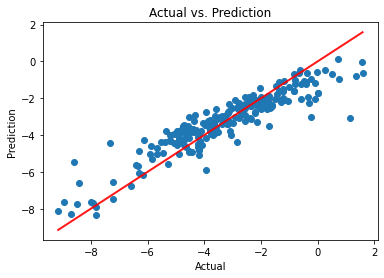

In [137]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_rf)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### model 12 : Random Forest for all variables

In [138]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        rf_reg_all = RandomForestRegressor(max_features = 67 , max_depth = grid.loc[i, 'max_depth'], 
                                         min_samples_leaf = grid.loc[i, 'min_samples_leaf'], 
                                         ccp_alpha = grid.loc[i, 'ccp_alpha'] ,n_estimators = 500)
        rf_res_all = rf_reg_all.fit(x_train_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred_rf_all = rf_res_all.predict(x_train_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_rf_all) ** 2).mean()

In [139]:
#Best Model
grid.loc[cv_errors.mean(axis = 0).argmin() + 1,:]

max_depth           15.0000
min_samples_leaf     2.0000
ccp_alpha            0.0001
Name: 49, dtype: float64

In [140]:
rf_reg_all =RandomForestRegressor(max_features = 67,
                                        min_samples_leaf = 2 ,
                                        max_depth =15 ,
                                        ccp_alpha = 0.0001 ,random_state = 123, n_estimators = 500)
rf_res_all = rf_reg_all.fit(x_train, y_train)

In [231]:
Importance = pd.DataFrame({'Importance':rf_res_all.feature_importances_ * 100}, 
                          index = x_test.columns)
Importance.sort_values(by = 'Importance', axis = 0, ascending = False)

,Importance
x48,35.775199
x49,10.683889
x78,7.832093
x9,7.106252
x15,3.668940
x13,3.599959
x6,2.429267
x39,2.060667
x41,1.622357
x47,1.613481


#### Model 12 : Prediction on TestDataset

In [143]:
pred_rf_all = rf_res_all.predict(x_test)

In [144]:
#Absolute error
abs_err_rf_all = abs(y_test - pred_rf_all)

In [145]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_rf_all.mean(),
                                             'Median of AbsErrors' : abs_err_rf_all.median(),
                                             'SD of AbsErrors' :     abs_err_rf_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_rf_all),
                                             'Min of AbsErrors':     abs_err_rf_all.min(),
                                             'Max of AbsErrors':     abs_err_rf_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_rf_all)}, index = ['Random Forest Reg All Variable']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


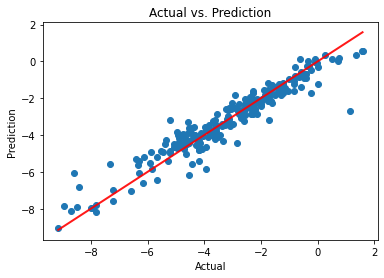

In [146]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_rf_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### model 13 : GB Regression
Gradient boosting is a boosting ensemble method.

Ensemble machine learning methods are ones in which a number of predictors are aggregated to form a final prediction, which has lower bias and variance than any of the individual predictors.
Gradient boosting produces an ensemble of decision trees that, on their own, are weak decision models.

In [147]:
#K-Fold Cross Validation for Choosing Hyper-parameters
#Create Hyper-parameters grid
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 0.9]
max_depth = [3, 6, 9]
min_samples_leaf= [2, 5 , 7]
grid = list(itertools.product(learning_rate, subsample, max_depth , min_samples_leaf))
grid = pd.DataFrame(data = grid, index = range(1, 82), columns = ['learning_rate', 'subsample', 'max_depth' ,'min_samples_leaf'])
grid

,learning_rate,subsample,max_depth,min_samples_leaf
1,0.001,0.5,3,2
2,0.001,0.5,3,5
3,0.001,0.5,3,7
4,0.001,0.5,6,2
5,0.001,0.5,6,5
6,0.001,0.5,6,7
7,0.001,0.5,9,2
8,0.001,0.5,9,5
9,0.001,0.5,9,7
10,0.001,0.7,3,2


In [148]:
k = 10
cv_errors = pd.DataFrame(index = range(1, k + 1), columns = range(1, 82))
cv_errors

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [149]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        boosting_reg = GradientBoostingRegressor(learning_rate = grid.loc[i, 'learning_rate'], 
                                                 subsample = grid.loc[i, 'subsample'], 
                                                 max_depth = grid.loc[i, 'max_depth'],
                                                 n_estimators = 500,
                                                 min_samples_leaf= grid.loc[i, 'min_samples_leaf'],
                                                 random_state = 1234)
        boosting_res = boosting_reg.fit(x_train_pca_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred = boosting_res.predict(x_train_pca_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred) ** 2).mean()

In [150]:
cv_errors

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81
1,3.173124,3.174245,3.174825,2.786955,2.781952,2.798741,2.703198,2.729314,2.752572,3.148638,3.149666,3.148423,2.729022,2.735548,2.73762,2.628191,2.64965,2.668958,3.160524,3.161147,3.163829,2.704889,2.715948,2.720767,2.615426,2.614746,2.633034,0.956065,0.969676,0.956444,0.829174,0.830149,0.813406,0.861931,0.831653,0.794285,0.988257,0.982476,0.974023,0.822432,0.79744,0.816402,0.868974,0.814126,0.793375,0.989857,1.009661,1.005692,0.872395,0.859058,0.849679,1.027758,0.915485,0.874653,0.767094,0.762364,0.747143,0.836926,0.720387,0.819005,0.815085,0.925409,0.930687,0.749889,0.732626,0.666851,0.864888,0.749588,0.773407,0.985129,0.926934,0.804099,0.70551,0.75439,0.717122,0.940201,0.80725,0.756766,1.046361,0.881337,0.869687
2,3.626054,3.629277,3.630997,3.189236,3.21976,3.244176,3.128896,3.186473,3.210558,3.662517,3.66435,3.667616,3.160416,3.193522,3.205726,3.087012,3.140001,3.166728,3.738622,3.739563,3.738956,3.176448,3.212468,3.227319,3.092978,3.139672,3.166504,1.239155,1.249754,1.255631,1.064849,1.076329,1.107976,1.07068,1.064075,1.062921,1.251005,1.268656,1.269872,1.152049,1.131288,1.14817,1.194524,1.153755,1.130989,1.259991,1.260975,1.252742,1.213252,1.203409,1.20042,1.354343,1.249261,1.23216,1.053981,1.018758,1.061385,1.066875,1.136691,0.992784,1.002776,1.136478,0.977145,0.937057,0.95355,0.940959,0.926999,1.270355,1.168816,1.194734,1.167279,1.20364,0.996933,1.031679,1.081305,1.227236,1.177676,1.164368,1.34092,1.27551,1.191918
3,2.489066,2.484552,2.486475,2.09683,2.104038,2.124425,2.026538,2.060277,2.095473,2.486449,2.483859,2.485187,2.041136,2.065328,2.086469,1.973776,2.007813,2.037091,2.487119,2.486145,2.493268,2.001538,2.007996,2.043575,1.925452,1.939875,1.989025,0.604017,0.612219,0.600235,0.476041,0.477861,0.469231,0.452107,0.465885,0.448192,0.613199,0.614124,0.617196,0.484062,0.471269,0.482352,0.48882,0.500195,0.474054,0.636565,0.641915,0.635109,0.462054,0.47476,0.488221,0.494044,0.45765,0.477332,0.554306,0.503555,0.468373,0.47191,0.509302,0.463945,0.446562,0.466032,0.470476,0.509953,0.503003,0.561187,0.597839,0.527435,0.499454,0.543628,0.496006,0.430441,0.48854,0.459096,0.471574,0.483114,0.493295,0.479693,0.491521,0.481556,0.533051
4,2.480662,2.479538,2.478438,2.151389,2.159264,2.16362,2.096824,2.11662,2.13058,2.47387,2.473719,2.472265,2.128487,2.126233,2.128501,2.054744,2.075679,2.080893,2.479374,2.481429,2.480645,2.110429,2.124335,2.121978,2.04467,2.069178,2.073945,0.763616,0.749882,0.751903,0.568933,0.611796,0.584705,0.556508,0.600733,0.573834,0.766298,0.781731,0.773341,0.604797,0.629484,0.624525,0.632472,0.646482,0.636502,0.769061,0.798875,0.796659,0.599305,0.630393,0.611995,0.687199,0.665932,0.608768,0.552304,0.585163,0.6921,0.560988,0.625465,0.593042,0.619397,0.767946,0.689457,0.662842,0.673887,0.726651,0.602934,0.565509,0.766304,0.673081,0.785225,0.754849,0.646819,0.653919,0.686483,0.594239,0.595211,0.619298,0.741538,0.66365,0.646291
5,2.635965,2.631154,2.629586,2.266751,2.26073,2.278751,2.201918,2.21299,2.241854,2.639955,2.637369,2.635528,2.24076,2.222454,2.231901,2.171795,2.176788,2.182542,2.655127,2.654433,2.65014,2.262756,2.257035,2.241719,2.176828,2.179908,2.188467,0.875961,0.866491,0.856551,0.695718,0.716838,0.694702,0.694684,0.686336,0.693894,0.880423,0.879455,0.872277,0.701503,0.688148,0.699435,0.772581,0.712124,0.694649,0.912707,0.907701,0.905742,0.755595,0.767227,0.743351,0.88987,0.836537,0.780801,0.693347,0.699428,0.647071,0.632145,0.69096,0.664239,0.813596,0.791949,0.741729,0.637459,0.667783,0.728097,0.667109,0.699639,0.675034,0.884879,0.712361,0.665901,0.629009,0.631245,0.689084,0.767027,0.784062,0.6867,0.849299,0.844048,0.733947
6,2.655024,2.65309,2.65285,2.2985,2.313452,2.318375,2.225544,2.259603,2.27834,2.686874,2.683763,2.682806,2.258821,2.272807,2.282524,2.183034,2.21054

In [151]:
cv_errors.mean(axis = 0)

1     2.775925
2     2.774151
3     2.775043
4     2.406489
5     2.417196
6     2.433389
7     2.344744
8     2.373431
9     2.397526
10    2.782675
11    2.781466
12    2.782023
13    2.377606
14    2.383352
15    2.394854
16    2.305070
17    2.326186
18    2.346865
19    2.799714
20    2.798854
21    2.798906
22    2.371400
23    2.376585
24    2.387351
25    2.298340
26    2.308254
27    2.327971
28    0.821972
29    0.828340
30    0.823860
31    0.671176
32    0.681853
33    0.675991
34    0.679957
35    0.667535
36    0.657631
37    0.840956
38    0.844752
39    0.840149
40    0.706171
41    0.699634
42    0.707076
43    0.745018
44    0.713998
45    0.699307
46    0.859695
47    0.863988
48    0.859639
49    0.747783
50    0.738237
51    0.731575
52    0.852266
53    0.788160
54    0.763425
55    0.619906
56    0.637610
57    0.635911
58    0.678060
59    0.688874
60    0.686846
61    0.715017
62    0.744821
63    0.701925
64    0.636317
65    0.631364
66    0.638666
67    0.72

In [152]:
cv_errors.mean(axis = 0).argmin() + 1

73

In [153]:
grid.iloc[cv_errors.mean(axis = 0).argmin() + 1, :]

learning_rate       0.1
subsample           0.9
max_depth           3.0
min_samples_leaf    5.0
Name: 74, dtype: float64

#### Model 13: Prediction on the Test Dataset

In [154]:
boosting_reg_ = GradientBoostingRegressor(learning_rate = 0.1,  #learning rate
                                         n_estimators = 500,  #the total number of trees to fit
                                         subsample = 0.9,      #the fraction of samples to be used,  
                                                           #if .< 1, Stochastic GB
                                         max_depth = 3,        #the maximum depth of each tree
                                         min_samples_leaf = 5, #the minimum number of observations in the leaf nodes of the trees
                                         random_state = 1234)

boosting_res_ = boosting_reg_.fit(x_train_pca , y_train)

In [155]:
pred_boosting_ = boosting_res_.predict(x_test_pca)

In [156]:
#Absolute error
abs_err_boosting = abs(y_test - pred_boosting_)

In [157]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_boosting.mean(),
                                             'Median of AbsErrors' : abs_err_boosting.median(),
                                             'SD of AbsErrors' :     abs_err_boosting.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_boosting),
                                             'Min of AbsErrors':     abs_err_boosting.min(),
                                             'Max of AbsErrors':     abs_err_boosting.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_boosting_)}, index = ['GB Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


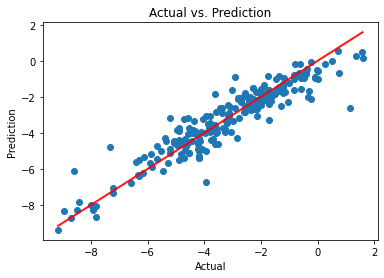

In [158]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_boosting_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 14 : GB for all variables

In [159]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        boosting_reg_all = GradientBoostingRegressor(learning_rate = grid.loc[i, 'learning_rate'], 
                                                 subsample = grid.loc[i, 'subsample'], 
                                                 max_depth = grid.loc[i, 'max_depth'],
                                                 n_estimators = 500,
                                                 min_samples_leaf= grid.loc[i, 'min_samples_leaf'],
                                                 random_state = 1234)
        boosting_res_all = boosting_reg_all.fit(x_train_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred_boosting_all = boosting_res_all.predict(x_train_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_boosting_all) ** 2).mean()

In [160]:
cv_errors.mean(axis = 0)

1     2.149190
2     2.149131
3     2.149708
4     1.960465
5     1.967523
6     1.976166
7     1.924949
8     1.942142
9     1.958879
10    2.154920
11    2.154867
12    2.155259
13    1.950847
14    1.957147
15    1.963405
16    1.908169
17    1.923251
18    1.936965
19    2.159259
20    2.158783
21    2.158948
22    1.948222
23    1.949681
24    1.959126
25    1.896772
26    1.908274
27    1.926308
28    0.427810
29    0.432565
30    0.439636
31    0.373064
32    0.378288
33    0.379194
34    0.376281
35    0.377474
36    0.376561
37    0.429056
38    0.433962
39    0.438183
40    0.380915
41    0.386428
42    0.386850
43    0.392440
44    0.388730
45    0.388404
46    0.437426
47    0.440063
48    0.445939
49    0.400244
50    0.403186
51    0.401088
52    0.422233
53    0.419263
54    0.409194
55    0.352787
56    0.370968
57    0.370564
58    0.366234
59    0.392235
60    0.366512
61    0.379708
62    0.406823
63    0.374235
64    0.335752
65    0.352045
66    0.357370
67    0.37

In [161]:
cv_errors.mean(axis = 0).argmin() + 1

64

In [162]:
grid.iloc[cv_errors.mean(axis = 0).argmin() + 1, :]

learning_rate       0.1
subsample           0.7
max_depth           3.0
min_samples_leaf    5.0
Name: 65, dtype: float64

In [163]:
boosting_reg_all_= GradientBoostingRegressor(learning_rate = 0.1,  #learning rate
                                         n_estimators = 500,  #the total number of trees to fit
                                         subsample = 0.7,      #the fraction of samples to be used,  
                                                                    #if .< 1, Stochastic GB
                                         max_depth = 3,        #the maximum depth of each tree
                                         min_samples_leaf = 5, #the minimum number of observations in the leaf nodes of the trees
                                         random_state = 1234)

boosting_res_all_ = boosting_reg_all_.fit(x_train , y_train)

In [164]:
pred_boosting_all_ = boosting_res_all_.predict(x_test)

In [165]:
#Absolute error
abs_err_boosting_all = abs(y_test - pred_boosting_all_)

In [166]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_boosting_all.mean(),
                                             'Median of AbsErrors' : abs_err_boosting_all.median(),
                                             'SD of AbsErrors' :     abs_err_boosting_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_boosting_all),
                                             'Min of AbsErrors':     abs_err_boosting_all.min(),
                                             'Max of AbsErrors':     abs_err_boosting_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_boosting_all_)}, index = ['GB Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


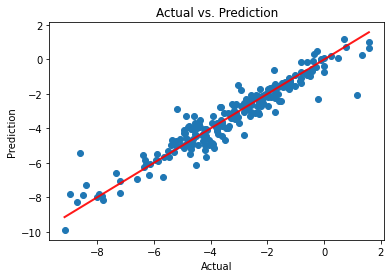

In [167]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_boosting_all_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 15 : XGBoost Regression
XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way.

In [168]:
from xgboost import XGBRegressor

In [169]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        xgb_reg = XGBRegressor(learning_rate = grid.loc[i, 'learning_rate'], 
                                                 subsample = grid.loc[i, 'subsample'], 
                                                 max_depth = grid.loc[i, 'max_depth'],
                                                 n_estimators = 500, reg_alpha =0.001,
                                                 reg_lambda = 0.0267, n_jobs = -1,
                                                 min_samples_leaf= grid.loc[i, 'min_samples_leaf'],
                                                 random_state = 1234)
        xgb_res = xgb_reg.fit(x_train_pca_const_df.iloc[folds != j, 1:], y_train[folds != j])
        pred = xgb_res.predict(x_train_pca_const_df.iloc[folds == j, 1:])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred) ** 2).mean()

[08:15:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[08:15:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[08:15:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be 

In [170]:
grid.iloc[cv_errors.mean(axis = 0).argmin() + 1, :]

learning_rate       0.1
subsample           0.7
max_depth           3.0
min_samples_leaf    5.0
Name: 65, dtype: float64

In [171]:
xgb_reg_ = XGBRegressor(n_estimators = 500,
                       max_depth = 3,               #the maximum depth of each tree
                       learning_rate = 0.1,        #learning rate      
                       subsample = 0.7,             #the fraction of samples to be used when constructing each tree
                    
                        min_samples_leaf = 5,         
                       reg_alpha = 0.001,             #L1 (Lasso) regularization term
                       reg_lambda = 0.0267,            #L2 (Ridge) regularization term
                       n_jobs = -1,                 #-1 means using all processors.
                       random_state = 1234)

xgb_res_ = xgb_reg_.fit(x_train_pca, y_train)

[09:10:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




#### Model 15: Prediction on Test Dataset

In [172]:
pred_xgb_ = xgb_res_.predict(x_test_pca)

In [173]:
#Absolute error
abs_err_xgb = abs(y_test - pred_xgb_)

In [174]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_xgb.mean(),
                                             'Median of AbsErrors' : abs_err_xgb.median(),
                                             'SD of AbsErrors' :     abs_err_xgb.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_xgb),
                                             'Min of AbsErrors':     abs_err_xgb.min(),
                                             'Max of AbsErrors':     abs_err_xgb.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_xgb_)}, index = ['XGB Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


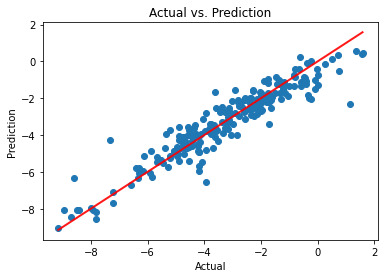

In [175]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_xgb_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 16 : XGBoost Regression for All Variables

In [176]:
for i in range(1, grid.shape[0] + 1):
    for j in range(1, k + 1):
        xgb_reg_all = XGBRegressor(learning_rate = grid.loc[i, 'learning_rate'], 
                                                 subsample = grid.loc[i, 'subsample'], 
                                                 max_depth = grid.loc[i, 'max_depth'],
                                                 n_estimators = 500, reg_alpha =0.001,
                                                 reg_lambda =5.72, n_jobs = -1,
                                                 colsample_bytree = 0.3,
                                                 min_samples_leaf= grid.loc[i, 'min_samples_leaf'],
                                                 random_state = 1234)
        xgb_res_all = xgb_reg_all.fit(x_train.iloc[folds != j, :], y_train[folds != j])
        pred_xgb_all = xgb_res_all.predict(x_train.iloc[folds == j, :])
        cv_errors.iloc[j - 1, i - 1] = ((y_train[folds == j] - pred_xgb_all) ** 2).mean()

[09:11:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[09:11:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[09:11:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be 

In [177]:
grid.iloc[cv_errors.mean(axis = 0).argmin() + 1, :]

learning_rate       0.1
subsample           0.9
max_depth           3.0
min_samples_leaf    5.0
Name: 74, dtype: float64

In [178]:
xgb_reg_all = XGBRegressor(n_estimators = 500,
                       max_depth = 3,               #the maximum depth of each tree
                       learning_rate = 0.1,        #learning rate      
                       subsample = 0.9,             #the fraction of samples to be used when constructing each tree
                       colsample_bytree = 0.3,
                       min_samples_leaf= 5 ,        
                       reg_alpha = 0.001,             #L1 (Lasso) regularization term
                       reg_lambda = 5.72,            #L2 (Ridge) regularization term
                       n_jobs = -1,                 #-1 means using all processors.
                       random_state = 1234)

xgb_res_all = xgb_reg_all.fit(x_train, y_train)

[09:46:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "min_samples_leaf" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [179]:
pred_xgb_all = xgb_res_all.predict(x_test)

In [180]:
#Absolute error
abs_err_xgb_all = abs(y_test - pred_xgb_all)

In [181]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_xgb_all.mean(),
                                             'Median of AbsErrors' : abs_err_xgb_all.median(),
                                             'SD of AbsErrors' :     abs_err_xgb_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_xgb_all),
                                             'Min of AbsErrors':     abs_err_xgb_all.min(),
                                             'Max of AbsErrors':     abs_err_xgb_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_xgb_all)}, index = ['XGB Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


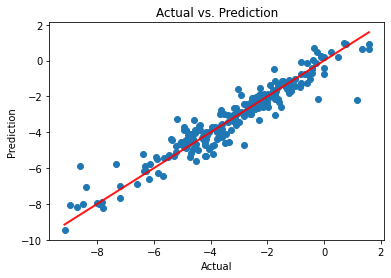

In [182]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_xgb_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 17 : Support Vector Machine(SVM)
In machine learning, support-vector machines are supervised learning models with associated learning algorithms that analyze data for classification and regression analysis.

In [183]:
svm_pca = SVR()
svm_res = svm_pca.fit(x_train_pca, y_train)

### Model 17 : Predction on Datasets

In [184]:
pred_svm_reg_pca = svm_res.predict(x_test_pca)

In [185]:
#Absolute error
abs_err_svm_pca = abs(y_test - pred_svm_reg_pca)

In [186]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_svm_pca.mean(),
                                             'Median of AbsErrors' : abs_err_svm_pca.median(),
                                             'SD of AbsErrors' :     abs_err_svm_pca.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_svm_pca),
                                             'Min of AbsErrors':     abs_err_svm_pca.min(),
                                             'Max of AbsErrors':     abs_err_svm_pca.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_svm_reg_pca)}, index = ['SVM Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


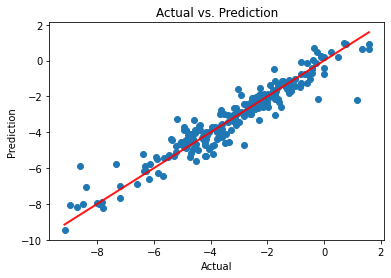

In [187]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_xgb_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model  18 : Support Vector Machin for All Variables

In [188]:
svm_reg_all = SVR()
svm_reg_all.fit(x_train, y_train)

SVR()

#### Model 18 : Prediction on Datasets

In [189]:
pred_svm_reg_all = svm_reg_all.predict(x_test)

In [190]:
#Absolute error
abs_err_svm_all = abs(y_test - pred_svm_reg_all)

In [191]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_svm_all.mean(),
                                             'Median of AbsErrors' : abs_err_svm_all.median(),
                                             'SD of AbsErrors' :     abs_err_svm_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_svm_all),
                                             'Min of AbsErrors':     abs_err_svm_all.min(),
                                             'Max of AbsErrors':     abs_err_svm_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_svm_reg_all)}, index = ['SVM Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


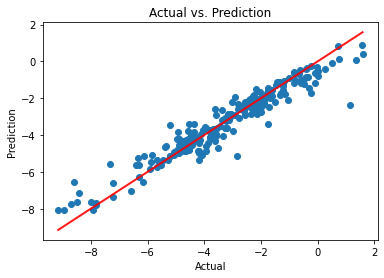

In [192]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_svm_reg_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 19 : ADABOOST 
AdaBoost is easy to implement. It iteratively corrects the mistakes of the weak classifier and improves accuracy by combining weak learners. You can use many base classifiers with AdaBoost. AdaBoost is not prone to overfitting. This can be found out via experiment results, but there is no concrete reason available.

AdaBoost is sensitive to noise data. It is highly affected by outliers because it tries to fit each point perfectly. AdaBoost is slower compared to XGBoost.

In [193]:
from sklearn.ensemble import AdaBoostRegressor

In [194]:
DTR=DecisionTreeRegressor(max_depth = 10, min_samples_leaf = 15, ccp_alpha = 0.0001)
RegModel_adaboost = AdaBoostRegressor(n_estimators=1000, base_estimator=DTR ,learning_rate=0.01)


In [195]:
print(RegModel_adaboost)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0001,
                                                       max_depth=10,
                                                       min_samples_leaf=15),
                  learning_rate=0.01, n_estimators=1000)


In [196]:
reg_adaboost_pca = RegModel_adaboost.fit(x_train_pca , y_train)

In [197]:
pred_adaboost_pca = reg_adaboost_pca.predict(x_test_pca)

In [198]:
#Absolute error
abs_err_sadaboost_pca = abs(y_test - pred_adaboost_pca)

In [199]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_sadaboost_pca.mean(),
                                             'Median of AbsErrors' : abs_err_sadaboost_pca.median(),
                                             'SD of AbsErrors' :     abs_err_sadaboost_pca.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_sadaboost_pca),
                                             'Min of AbsErrors':     abs_err_sadaboost_pca.min(),
                                             'Max of AbsErrors':     abs_err_sadaboost_pca.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_adaboost_pca)}, index = ['AdaBoost Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


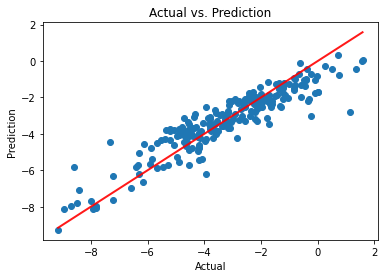

In [200]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_adaboost_pca)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 20 : KNN
The kNN algorithm is a supervised machine learning model. That means it predicts a target variable using one or multiple independent variables. 

In [201]:
from sklearn import neighbors
from math import sqrt
from sklearn.metrics import mean_squared_error

In [202]:
rmse_val_pca = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model_pca = neighbors.KNeighborsRegressor(n_neighbors = K)

    model_pca.fit(x_train_pca, y_train)  #fit the model
    pred_pca=model_pca.predict(x_test_pca) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred_pca)) #calculate rmse
    rmse_val_pca.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 1.0161169820640428
RMSE value for k=  2 is: 1.0043732349743013
RMSE value for k=  3 is: 0.9300645945045085
RMSE value for k=  4 is: 0.9197598963150486
RMSE value for k=  5 is: 0.9201248972550806
RMSE value for k=  6 is: 0.9286077640342981
RMSE value for k=  7 is: 0.9516382769940489
RMSE value for k=  8 is: 0.9901820903105609
RMSE value for k=  9 is: 1.0219260973704678
RMSE value for k=  10 is: 1.0173081299819802
RMSE value for k=  11 is: 1.0205592963345607
RMSE value for k=  12 is: 1.0370134279912053
RMSE value for k=  13 is: 1.0418929204327083
RMSE value for k=  14 is: 1.0591612752692483
RMSE value for k=  15 is: 1.0648263289642388
RMSE value for k=  16 is: 1.0618308719742258
RMSE value for k=  17 is: 1.0622826771218843
RMSE value for k=  18 is: 1.0706582691575892
RMSE value for k=  19 is: 1.076596804742546
RMSE value for k=  20 is: 1.0881009024414074


<AxesSubplot:>

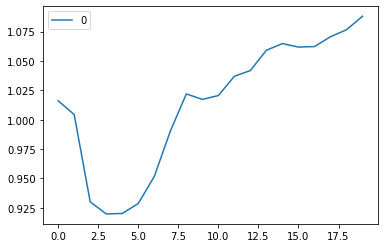

In [203]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val_pca) #elbow curve 
curve.plot()

- As we discussed, when we take k=1, we get a very high RMSE value. The RMSE value decreases as we increase the k value. At k= 5, the RMSE is approximately 0.922, and shoots up on further increasing the k value. We can safely say that k=5 will give us the best result in this case.

These are the predictions using our training dataset. Let us now predict the values for test dataset and make a submission.

### Model 20 : Predictions on the test dataset

In [204]:
model_pca_ = neighbors.KNeighborsRegressor(n_neighbors = 5)

In [205]:
model_pca_.fit(x_train_pca, y_train)

KNeighborsRegressor()

In [206]:
pred_knn_pca_ = model_pca_.predict(x_test_pca)

In [207]:
#Absolute error
abs_err_knn_pca_ = abs(y_test - pred_knn_pca_)

In [208]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_knn_pca_.mean(),
                                             'Median of AbsErrors' : abs_err_knn_pca_.median(),
                                             'SD of AbsErrors' :     abs_err_knn_pca_.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_knn_pca_),
                                             'Min of AbsErrors':     abs_err_knn_pca_.min(),
                                             'Max of AbsErrors':     abs_err_knn_pca_.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_knn_pca_)}, index = ['KNN Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


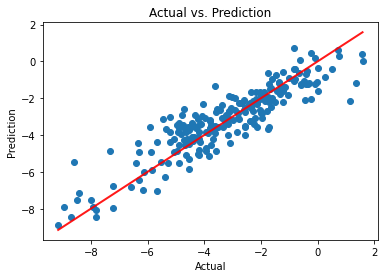

In [209]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_knn_pca_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model : KNN For All Variables

In [210]:
rmse_val_all = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model_pca_all = neighbors.KNeighborsRegressor(n_neighbors = K)

    model_pca_all.fit(x_train, y_train)  #fit the model
    pred_all=model_pca_all.predict(x_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred_all)) #calculate rmse
    rmse_val_all.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 1.0353913308332274
RMSE value for k=  2 is: 1.0142429088228053
RMSE value for k=  3 is: 0.9366930386066921
RMSE value for k=  4 is: 0.9337238162859282
RMSE value for k=  5 is: 0.9427814394003925
RMSE value for k=  6 is: 0.9686651385738515
RMSE value for k=  7 is: 0.982317326877871
RMSE value for k=  8 is: 1.0232926008179808
RMSE value for k=  9 is: 1.0211597997161466
RMSE value for k=  10 is: 1.0294193651883468
RMSE value for k=  11 is: 1.0267768902467405
RMSE value for k=  12 is: 1.0420557620205722
RMSE value for k=  13 is: 1.0488620891818172
RMSE value for k=  14 is: 1.0573040439759047
RMSE value for k=  15 is: 1.0697348969966847
RMSE value for k=  16 is: 1.0723292734960004
RMSE value for k=  17 is: 1.0779224108421799
RMSE value for k=  18 is: 1.0861457944163826
RMSE value for k=  19 is: 1.0924354231551292
RMSE value for k=  20 is: 1.091741314227077


<AxesSubplot:>

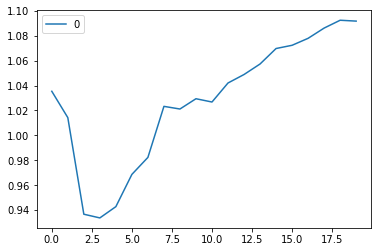

In [211]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val_all) #elbow curve 
curve.plot()

 As we discussed, when we take k=1, we get a very high RMSE value. The RMSE value decreases as we increase the k value. At k= 4, the RMSE is approximately 0.9337, and shoots up on further increasing the k value. We can safely say that k=4 will give us the best result in this case.

These are the predictions using our training dataset. Let us now predict the values for test dataset and make a submission.

In [212]:
model_all_ = neighbors.KNeighborsRegressor(n_neighbors = 4)
model_all_.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=4)

In [213]:
pred_knn_all_ = model_all_.predict(x_test)

In [214]:
#Absolute error
abs_err_knn_all_ = abs(y_test - pred_knn_all_)

In [215]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_knn_all_.mean(),
                                             'Median of AbsErrors' : abs_err_knn_all_.median(),
                                             'SD of AbsErrors' :     abs_err_knn_all_.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_knn_all_),
                                             'Min of AbsErrors':     abs_err_knn_all_.min(),
                                             'Max of AbsErrors':     abs_err_knn_all_.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_knn_all_)}, index = ['KNN Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


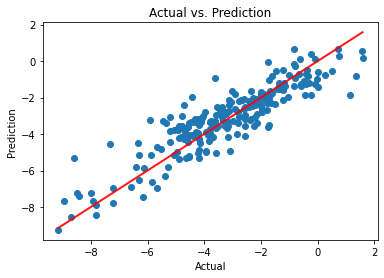

In [216]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_knn_all_)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model  21: Multilayer Perceptron (MLP)
A MLP consists of, at least, three layers of nodes: an input layer, a hidden layer and an output layer. Except for the input nodes, each node is a neuron that uses a nonlinear activation function . 

In [217]:
mlp_pca = MLPRegressor()
mlp_pca.fit(x_train_pca, y_train)
print(mlp_pca)

MLPRegressor()


In [218]:
pred_mlp_pca = mlp_pca.predict(x_test_pca)

In [219]:
#Absolute error
abs_err_mlp = abs(y_test - pred_mlp_pca)

In [220]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_mlp.mean(),
                                             'Median of AbsErrors' : abs_err_mlp.median(),
                                             'SD of AbsErrors' :     abs_err_mlp.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_mlp),
                                             'Min of AbsErrors':     abs_err_mlp.min(),
                                             'Max of AbsErrors':     abs_err_mlp.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_mlp_pca)}, index = ['MLP Reg PCA']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


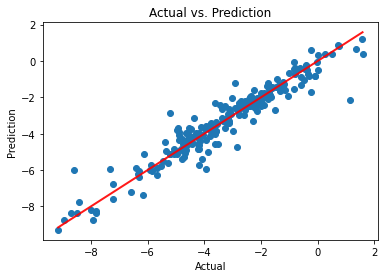

In [221]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_mlp_pca)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

### Model 22 : MLP For All Variables

In [222]:
mlp_all = MLPRegressor()
mlp_all.fit(x_train, y_train)

MLPRegressor()

In [223]:
pred_mlp_all = mlp_all.predict(x_test)

In [224]:
#Absolute error
abs_err_mlp_all = abs(y_test - pred_mlp_all)

In [225]:
#Absolute error mean, median, sd, IQR, max, min
from scipy.stats import iqr
model_comp = model_comp.append(pd.DataFrame({'Mean of AbsErrors':    abs_err_mlp_all.mean(),
                                             'Median of AbsErrors' : abs_err_mlp_all.median(),
                                             'SD of AbsErrors' :     abs_err_mlp_all.std(),
                                             'IQR of AbsErrors':     iqr(abs_err_mlp_all),
                                             'Min of AbsErrors':     abs_err_mlp_all.min(),
                                             'Max of AbsErrors':     abs_err_mlp_all.max(),
                                            'R^2-score' : metrics.r2_score(y_test, pred_mlp_pca)}, index = ['MLP Reg All Variables']), 
                               ignore_index = False)

model_comp

,Mean of AbsErrors,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors,R^2-score
LM Reg PCA,0.547305,0.421018,0.496421,0.499233,0.001250,3.087932,0.876103
LM Reg All Variables,0.557660,0.391625,0.530183,0.500443,0.004216,3.054768,0.865656
Ridge Reg PCA,0.549234,0.424161,0.491562,0.515300,0.016369,3.115507,0.876709
Ridge Reg All Variables,0.957500,0.767662,0.785779,1.078682,0.004350,4.199069,0.651762
Lasso Reg PCA,0.583556,0.474700,0.506530,0.581610,0.001286,3.322734,0.864487
Lasso Reg All Variables,0.603030,0.462729,0.514093,0.579391,0.007978,3.346922,0.857485
Decision Tree Reg All Variables,0.682087,0.577824,0.569314,0.622367,0.000595,4.171648,0.820841
Bagging Reg PCA,0.637403,0.506196,0.577829,0.638506,0.000673,3.830325,0.820841
Bagging Reg All Variables,0.457234,0.307379,0.495121,0.480558,0.002400,3.773229,0.896969
Random Forest Reg PCA,0.637666,0.508818,0.596749,0.580672,0.001625,4.237025,0.826929


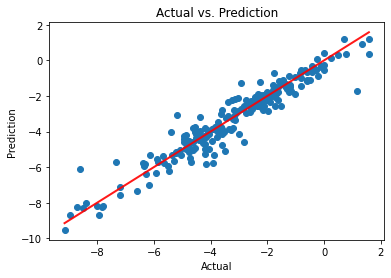

In [226]:
#Actual vs. Prediction
plt.scatter(x = y_test, y = pred_mlp_all)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction')

#Add 45 degree line
xp = np.linspace(y_test.min(), y_test.max(), 100)
plt.plot(xp, xp, alpha = 0.9, linewidth = 2, color = 'red')

- Conclusion:

Among all the fitted models, our best choice is the support vector machine model. There is no significant difference between the two fitted models with all variables and variables selected with PCA, but if we choose based on R2 and the mean and median of the absulote errors, we prefer the model with variables selected with PCA. And if we decide to choose based on the minimum standard deviation of absulote errors, we will choose the model that fits using all variables. 